计算四面体间隙直接扩散至相邻四面体间隙，或者经过八面体间隙扩散的能垒。并验证应变对能垒的调控作用。

calculate the energy barrier for direct diffusion between adjacent tetrahedral interstitial site and octahedral interstitial mediated diffusion. Investigate the strain modulation effects on these energy barriers.

In [20]:
from strain import *
from atoms_model import *
from ase.build import bulk, fcc110, add_adsorbate, add_vacuum
from ase.visualize import view

import os.path as path
from os.path import join
from copy import deepcopy
from ase.geometry import get_distances

import os
import shutil
from pathlib import Path
from ase.io import read, write
import plotly.graph_objects as go
import matplotlib.pyplot as plt

In [21]:
# 设置全局字体为 Times New Roman
plt.rcParams["font.family"] = "serif"          # 使用衬线字体
plt.rcParams["font.serif"] = ["Times New Roman"]  # 指定 Times New Roman

plt.rcParams["mathtext.fontset"] = "custom"
plt.rcParams["mathtext.rm"] = "Times New Roman"
plt.rcParams["mathtext.it"] = "Times New Roman:italic"
plt.rcParams["mathtext.bf"] = "Times New Roman:bold"

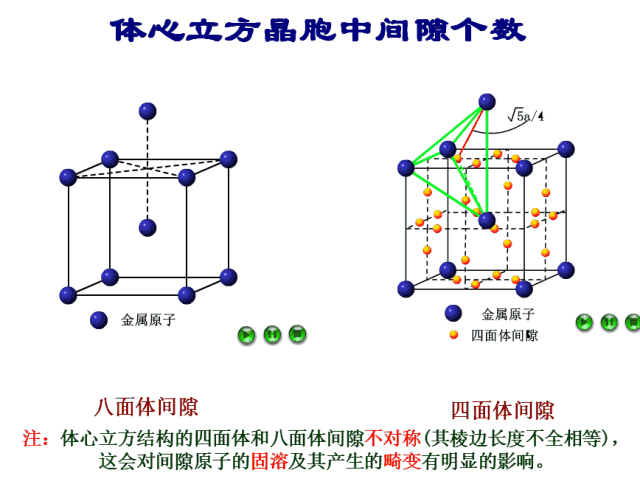

In [22]:
from IPython.display import Image

# 直接显示本地 GIF 文件
Image(filename="./interval.gif")

In [23]:
savepath = '/media/zwbai/DATA/strain/Cr_H2' # 保存路径
if not os.path.exists(savepath):
    os.makedirs(savepath)
else:
    print(f'{savepath} already exists')

/media/zwbai/DATA/strain/Cr_H2 already exists


In [24]:
in_bulk_path = join(savepath, 'Cr_mp_copy')
in_bulk_path

'/media/zwbai/DATA/strain/Cr_H2/Cr_mp_copy'

E0 value: -1 F   -.19022698E+02
Cell([[2.845635336816123, 0.0, 2e-16], [-2e-16, 2.845635336816123, 2e-16], [-0.0, -0.0, 2.845635336816123]])


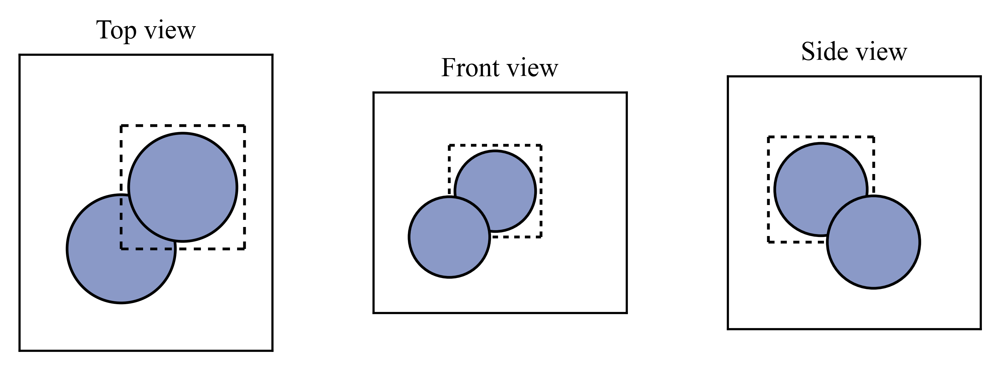

In [25]:
Cr_bulk = read_one_car(in_bulk_path)
Cr_bulk_e = read_one_car(in_bulk_path, car='OSZICAR')
print(Cr_bulk.cell)
plot_model(Cr_bulk)

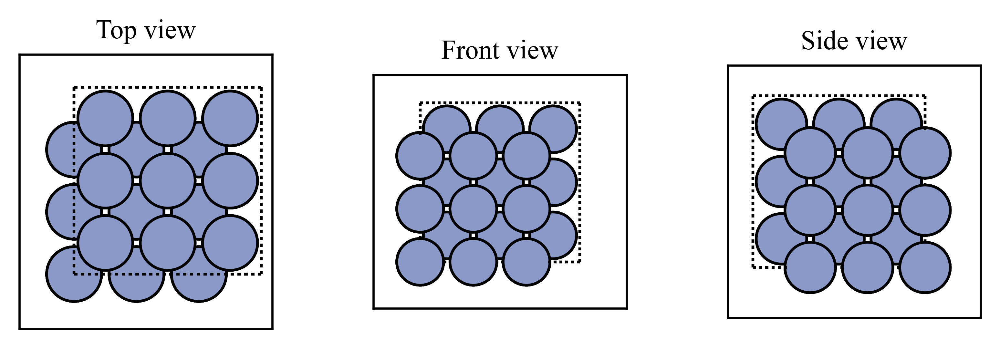

E0 value: -1 F   -.51325283E+03


In [26]:
bulk_model = Cr_bulk.copy()
repeat_para = 3
bulk_model = bulk_model.repeat((repeat_para, repeat_para, repeat_para))
plot_model(bulk_model)

bulk_path = join(savepath,'bulk')
out_poscar(bulk_model, path=bulk_path)

bulk_e = read_one_car(join(savepath,'bulk_copy'), car='OSZICAR')

# bulk

In [27]:
in_bulk_path = join(savepath,'in_bulk')
# 四面体位点_1
bulk_tetrahedral_1 = bulk_model.copy()
tetrahedral_site_1 = np.array([0.25, 0, 0.5])/repeat_para + 2/repeat_para*np.array([1,1,1])  # 四面体间隙
tetrahedral_pos_1 = np.dot(tetrahedral_site_1, bulk_tetrahedral_1.cell)
bulk_tetrahedral_1.append('H')
bulk_tetrahedral_1.positions[-1] = tetrahedral_pos_1
bulk_tetrahedral_1.set_constraint(FixAtoms(indices=[1]))
tetrahedral_path_1 = join(in_bulk_path,'is_tetra')
out_poscar(bulk_tetrahedral_1, path=tetrahedral_path_1)
# view(bulk_tetrahedral)
# 四面体位点_2
bulk_tetrahedral_2 = bulk_model.copy()
tetrahedral_site_2 = np.array([0., 0.25, 0.5])/repeat_para + 2/repeat_para*np.array([1,1,1])  # 四面体间隙
tetrahedral_pos_2 = np.dot(tetrahedral_site_2, bulk_tetrahedral_2.cell)
bulk_tetrahedral_2.append('H')
bulk_tetrahedral_2.positions[-1] = tetrahedral_pos_2
bulk_tetrahedral_2.set_constraint(FixAtoms(indices=[1]))
tetrahedral_path_2 = join(in_bulk_path,'fs_tetra')
out_poscar(bulk_tetrahedral_2, path=tetrahedral_path_2)
# view(bulk_tetrahedral)
# 八面体位点_ts
bulk_octahedral = bulk_model.copy()
octahedral_site = np.array([0, 0, 0.5])/repeat_para + 2/repeat_para*np.array([1,1,1])  # 四面体间隙
octahedral_pos = np.dot(octahedral_site, bulk_octahedral.cell)
bulk_octahedral.append('H')
bulk_octahedral.positions[-1] = octahedral_pos
bulk_octahedral.set_constraint(FixAtoms(indices=[1]))
octahedral_path = join(in_bulk_path,'ts_octa')
out_poscar(bulk_octahedral, path=octahedral_path)
# view(bulk_tetrahedral)

In [28]:
dis = bulk_tetrahedral_1.get_all_distances(mic=True)[-1]
np.where(dis > np.max(dis)-1e-2)

(array([ 1,  3, 20, 26]),)

In [29]:
in_bulk_savepath = join(savepath,'in_bulk_copy')
octahedral_copy = join(in_bulk_savepath,'ts_octa')
tetrahedral_is_copy = join(in_bulk_savepath,'is_tetra')
tetrahedral_fs_copy = join(in_bulk_savepath,'fs_tetra')
tetrahedral_ts_copy = join(in_bulk_savepath,'ts_tetra')

interval_tetrahedral_is = read_one_car(tetrahedral_is_copy)
interval_tetrahedral_is_f = read_one_car(tetrahedral_is_copy, car='OUTCAR')
interval_tetrahedral_fs = read_one_car(tetrahedral_fs_copy)
interval_tetrahedral_fs_f = read_one_car(tetrahedral_fs_copy, car='OUTCAR')

interval_octahedral = read_one_car(octahedral_copy)
interval_octahedral_e = read_one_car(octahedral_copy, car='OSZICAR')
interval_octahedral_f = read_one_car(octahedral_copy, car='OUTCAR')
interval_tetrahedral_is_e = read_one_car(tetrahedral_is_copy, car='OSZICAR')
interval_tetrahedral_fs_e = read_one_car(tetrahedral_fs_copy, car='OSZICAR')


E0 value: -1 F   -.51586648E+03
E0 value: -1 F   -.51604715E+03
E0 value: -1 F   -.51604720E+03


In [30]:
bulk_tetrahedral_1

Atoms(symbols='Cr54H', pbc=True, cell=[[8.53690601044837, 0.0, 6e-16], [-6e-16, 8.53690601044837, 6e-16], [-0.0, -0.0, 8.53690601044837]], constraint=FixAtoms(indices=[1]))

In [31]:
interval_tetrahedral_is_f

array([[ 4.517500e-02,  1.615800e-02,  3.954400e-02],
       [-1.223300e-02, -0.000000e+00, -5.997000e-03],
       [ 9.464000e-03, -8.483000e-03, -3.300000e-05],
       [-1.223400e-02,  0.000000e+00,  6.002000e-03],
       [ 4.513800e-02,  1.620600e-02, -3.951900e-02],
       [-1.981000e-03,  0.000000e+00,  3.000000e-06],
       [ 4.517500e-02, -1.615800e-02,  3.954400e-02],
       [-1.397600e-02, -6.571000e-03, -1.729100e-02],
       [ 9.464000e-03,  8.483000e-03, -3.300000e-05],
       [-1.387000e-02, -6.647000e-03,  1.721300e-02],
       [ 4.513800e-02, -1.620600e-02, -3.951900e-02],
       [ 1.850000e-03, -2.093500e-02,  8.400000e-05],
       [ 2.530370e-01, -0.000000e+00,  2.324340e-01],
       [-1.397600e-02,  6.571000e-03, -1.729100e-02],
       [-1.051500e-02,  0.000000e+00, -7.400000e-05],
       [-1.387000e-02,  6.647000e-03,  1.721300e-02],
       [ 2.530680e-01, -0.000000e+00, -2.323460e-01],
       [ 1.850000e-03,  2.093500e-02,  8.400000e-05],
       [ 1.393900e-02, -1.72

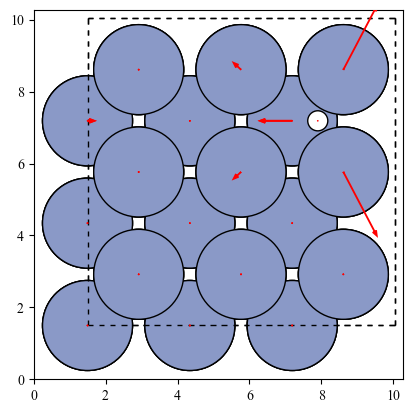

In [32]:
plot_stress(bulk_tetrahedral_1, interval_tetrahedral_is_f)

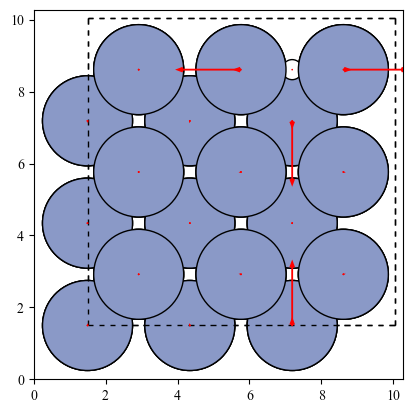

In [33]:
plot_stress(bulk_tetrahedral_1, interval_tetrahedral_is_f, rotation="-90x,-90y,0z")

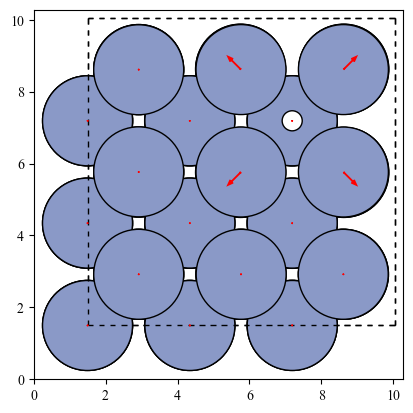

In [34]:
plot_stress(interval_octahedral, interval_octahedral_f)

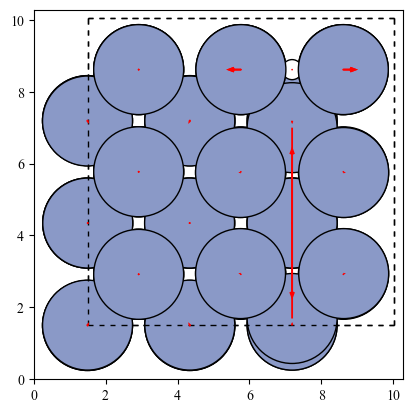

In [35]:
plot_stress(interval_octahedral, interval_octahedral_f, rotation="-90x,-90y,0z")

# neb

设计一种简单办法，可以通过直接给出两个初末状态的计算结果文件夹，直接生成对应的待计算的neb文件夹

### neb prepared

In [36]:
# os.system('cd /home && mkdir test')
is_fs_path = in_bulk_savepath # 存储初态和末态的地址 input_path

neb_name = [['is_tetra','fs_tetra'],['is_tetra','ts_octa']] # 构成neb的队列
n_mage_prepared = [3,5]

neb_path = join(savepath,'neb_diffusion') # 输出neb的地址 output_path

neb_diffusion_l,neb_diffusion_d  = create_neb(is_fs_path, neb_name, neb_path, n_mage_prepared=n_mage_prepared)

TypeError: stat: path should be string, bytes, os.PathLike or integer, not list

In [37]:
tetra_octa_neb_path = join(savepath,'neb_diffusion_copy', 'is_tetra-ts_octa')
tetra_octa_neb, tetra_octa_neb_d = read_car(tetra_octa_neb_path)
tetra_octa_neb_e, tetra_octa_neb_e_d = read_car(tetra_octa_neb_path, car='OSZICAR')
tetra_octa_neb_f, _ = read_car(tetra_octa_neb_path, car='OUTCAR')
tetra_octa_neb_f = np.array(tetra_octa_neb_f).reshape(-1, 3)
tetra_octa_neb_p  = [atoms.positions for atoms in tetra_octa_neb]

1st dict_keys(['00', '01', '02', '03', '04', '05', '06'])
E0 value: -1 F   -.51604715E+03
E0 value: -1 F   -.51603577E+03
E0 value: -1 F   -.51599191E+03
E0 value: -1 F   -.51593470E+03
E0 value: -1 F   -.51588666E+03
E0 value: -1 F   -.51586654E+03
E0 value: -1 F   -.51586648E+03
1st dict_keys(['00', '01', '02', '03', '04', '05', '06'])
1st dict_keys(['00', '01', '02', '03', '04', '05', '06'])


In [38]:
tetra_tetra_neb_path = join(savepath,'neb_diffusion_copy', 'is_tetra-fs_tetra')
tetra_tetra_neb, tetra_tetra_neb_d = read_car(tetra_tetra_neb_path)
tetra_tetra_neb_e, tetra_tetra_neb_e_d = read_car(tetra_tetra_neb_path, car='OSZICAR')
tetra_tetra_neb_f, _ = read_car(tetra_tetra_neb_path, car='OUTCAR')
tetra_tetra_neb_f = np.array(tetra_tetra_neb_f).reshape(-1, 3)
tetra_tetra_neb_p  = [atoms.positions for atoms in tetra_tetra_neb]

1st dict_keys(['00', '01', '02', '03', '04'])
E0 value: -1 F   -.51604715E+03
E0 value: -1 F   -.51599201E+03
E0 value: -1 F   -.51592827E+03
E0 value: -1 F   -.51599204E+03
E0 value: -1 F   -.51604720E+03
1st dict_keys(['00', '01', '02', '03', '04'])
1st dict_keys(['00', '01', '02', '03', '04'])


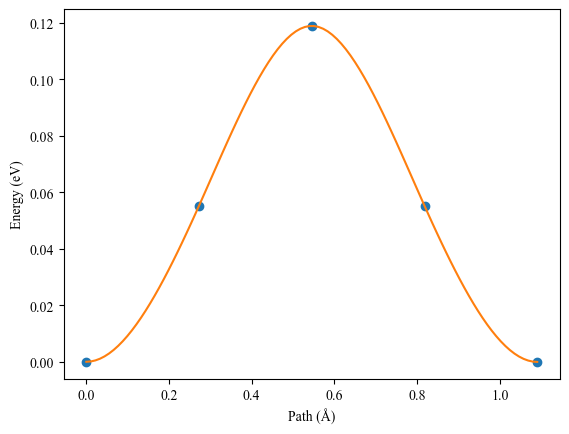

In [39]:
tetra_tetra_neb_x = get_dist_list(tetra_tetra_neb)
tetra_tetra_neb_e = np.array(tetra_tetra_neb_e)
tetra_tetra_neb_e0 = tetra_tetra_neb_e - tetra_tetra_neb_e[0]
x_interp1, y_interp1 = interpolate_plot(tetra_tetra_neb_x, tetra_tetra_neb_e0)

In [40]:
tetra_tetra_neb[2].get_positions()[-1]

bulk_tetrahedral_3 = bulk_model.copy()
bulk_tetrahedral_3.append('H')
bulk_tetrahedral_3.positions[-1] = tetra_tetra_neb[2].get_positions()[-1]
bulk_tetrahedral_3.set_constraint(FixAtoms(indices=[1]))
tetrahedral_path_3 = join(in_bulk_path,'ts_tetra')
out_poscar(bulk_tetrahedral_3, path=tetrahedral_path_3)

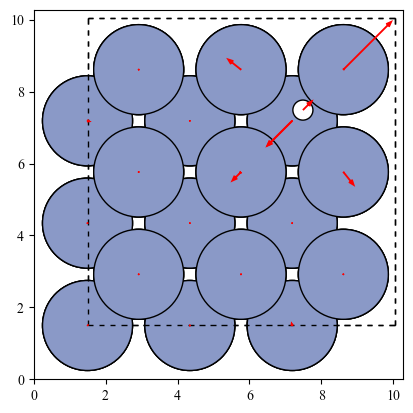

In [41]:
interval_tetrahedral_ts = read_one_car(tetrahedral_ts_copy)
interval_tetrahedral_ts_f = read_one_car(tetrahedral_ts_copy, car='OUTCAR')
plot_stress(bulk_tetrahedral_3, interval_tetrahedral_ts_f)

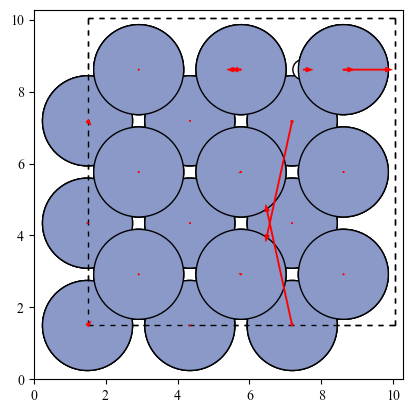

In [42]:
plot_stress(bulk_tetrahedral_3, interval_tetrahedral_ts_f, rotation="-90x,-90y,0z")

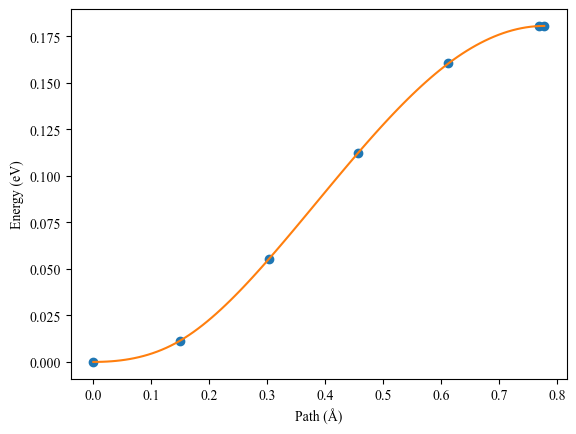

In [43]:
tetra_octa_neb_x = get_dist_list(tetra_octa_neb)
tetra_octa_neb_e = np.array(tetra_octa_neb_e)
tetra_octa_neb_e0 = tetra_octa_neb_e - tetra_octa_neb_e[0]
x_interp, y_interp = interpolate_plot(tetra_octa_neb_x, tetra_octa_neb_e0)

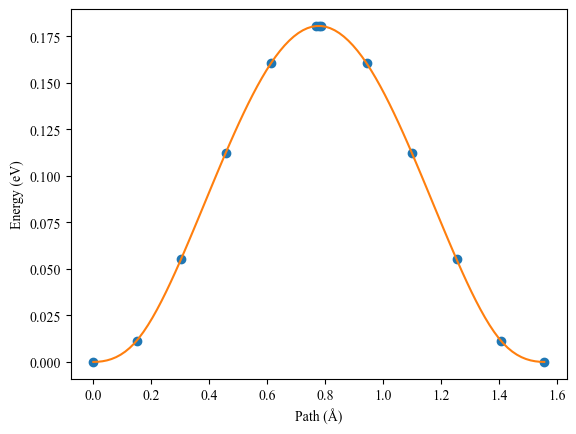

In [44]:
tetra_octa_tetra_neb_x = tetra_octa_neb_x.copy()
stress_strain_is3 = tetra_octa_neb_x[::-1]
for k in range(len(stress_strain_is3)-1):
    d = (stress_strain_is3[k] - stress_strain_is3[k+1])
    tetra_octa_tetra_neb_x = np.append(tetra_octa_tetra_neb_x, d+tetra_octa_tetra_neb_x[-1])

tetra_octa_tetra_neb_e = tetra_octa_neb_e0.copy()
stress_strain_is3 = tetra_octa_neb_e0[::-1]
tetra_octa_tetra_neb_e = np.append(tetra_octa_tetra_neb_e, stress_strain_is3[1:])

x_interp2, y_interp2 = interpolate_plot(tetra_octa_tetra_neb_x, tetra_octa_tetra_neb_e)

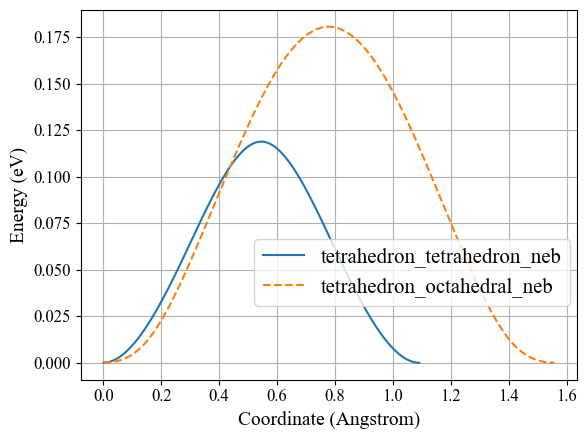

In [45]:

# 绘制图形
plt.plot(x_interp1, y_interp1, label='tetrahedron_tetrahedron_neb', linestyle='-')  # 实线
plt.plot(x_interp2, y_interp2, label='tetrahedron_octahedral_neb', linestyle='--') # 虚线

# 添加标签和图例
# plt.title("Sin & Cos 曲线对比")
plt.xlabel("Coordinate (Angstrom)", fontsize=14)
plt.ylabel("Energy (eV)", fontsize=14)
plt.legend(loc=(0.35,0.2), fontsize=15,)
plt.grid()  # 添加网格线
# 设置坐标轴大小
plt.tick_params(axis='both', which='major', labelsize=12)

# 显示图形
plt.show()

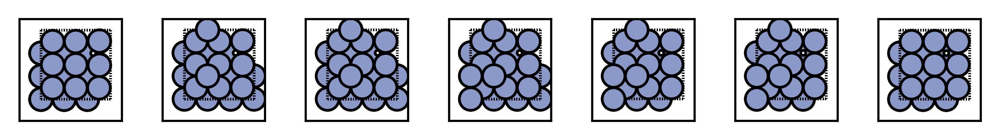

In [46]:
plot_top(tetra_octa_neb, column=len(tetra_octa_neb))

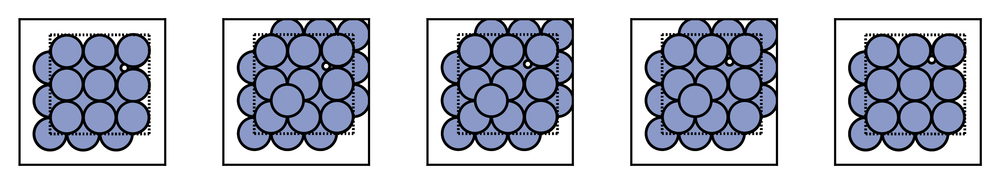

In [47]:
plot_top(tetra_tetra_neb, column=len(tetra_tetra_neb))

In [48]:
reference = bulk_model
deformation = interval_tetrahedral_is

cutoffs = natural_cutoffs(reference)
nl = NeighborList(cutoffs, self_interaction=False, bothways=True)
nl.update(reference)
# 关键变量，紧邻关系
cutoffs = natural_cutoffs(deformation)
nl = NeighborList(np.array(cutoffs), self_interaction=False, bothways=True)
nl.update(deformation)
nl_deformation = nl


In [49]:
stress_strain_is3 = [nl_deformation.get_neighbors(i)[0] for i in [0,1]]
np.concatenate(stress_strain_is3)

array([ 1,  6,  2,  4,  5, 12, 13, 17, 18, 36, 37, 41, 49, 53, 26, 20, 19,
        6,  7,  3,  0,  2,  5,  8, 13, 18, 24, 37])

# Strain visualization

In [50]:
Z_of_type1 = {1: 24, 2: 1, 3: 26}  # Fe(26), H(1), Cr(24)
Z_of_type2 = {1: 26, 2: 1, 3: 24}  # Fe(26), H(1), Cr(24)

In [51]:
bulk_md = Cr_bulk.copy()
cell = bulk_md.get_cell()
for k in range(3):
    cell[k][k] = 2.83545636408353 # 势函数对应的晶格常数
bulk_md.set_cell(cell, scale_atoms=True)

repeat_para_md = 9
bulk_md = bulk_md.repeat((repeat_para_md, repeat_para_md, repeat_para_md))

In [52]:
in_bulk_path_md = join(savepath,'in_bulk_md')
bulk_md_path = join(in_bulk_path_md,'bulk')
out_poscar(bulk_md, path=bulk_md_path)

filename = join(bulk_md_path,'bulk_md.data')
write(filename, bulk_md, format="lammps-data")  # 读写检验

In [53]:
in_bulk_path_md_copy = join(savepath,'in_bulk_md_copy')
bulk_md_path = join(in_bulk_path_md_copy,'bulk')

sort_lammps_data(join(bulk_md_path, 'bulk_md.data'), join(bulk_md_path, 'sorted_bulk_md.data'))
bulk_md2 = read(join(bulk_md_path, 'sorted_bulk_md.data'), format='lammps-data', style='atomic',Z_of_type=Z_of_type1)

sort_lammps_data(join(bulk_md_path, 'bulk.data'), join(bulk_md_path, 'sorted_bulk.data'))
bulk_md_copy = read(join(bulk_md_path, 'sorted_bulk.data'), format='lammps-data', style='atomic',Z_of_type=Z_of_type2)

In [54]:
half = (repeat_para_md-1)/2

# 四面体位点_1
bulk_tetrahedral_1_md = bulk_md.copy()
tetrahedral_site_1 = np.array([0.25, 0, 0.5])/repeat_para_md + half/repeat_para_md*np.array([1,1,2])  # 四面体间隙
tetrahedral_pos_1 = np.dot(tetrahedral_site_1, bulk_tetrahedral_1_md.cell)
bulk_tetrahedral_1_md.append('H')
bulk_tetrahedral_1_md.positions[-1] = tetrahedral_pos_1
bulk_tetrahedral_1_md.set_constraint(FixAtoms(indices=[1]))
tetrahedral_path_1 = join(in_bulk_path_md,'is_tetra')
out_poscar(bulk_tetrahedral_1_md, path=tetrahedral_path_1)
filename = join(tetrahedral_path_1,'bulk_md.data')
write(filename, bulk_tetrahedral_1_md, format="lammps-data")  # 读写检验
# view(bulk_tetrahedral)
# 四面体位点_2
bulk_tetrahedral_2_md = bulk_md.copy()
tetrahedral_site_2 = np.array([0., 0.25, 0.5])/repeat_para_md + half/repeat_para_md*np.array([1,1,2])  # 四面体间隙
tetrahedral_pos_2 = np.dot(tetrahedral_site_2, bulk_tetrahedral_2_md.cell)
bulk_tetrahedral_2_md.append('H')
bulk_tetrahedral_2_md.positions[-1] = tetrahedral_pos_2
bulk_tetrahedral_2_md.set_constraint(FixAtoms(indices=[1]))
tetrahedral_path_2 = join(in_bulk_path_md,'fs_tetra')
out_poscar(bulk_tetrahedral_2_md, path=tetrahedral_path_2)
filename = join(tetrahedral_path_2,'bulk_md.data')
write(filename, bulk_tetrahedral_2_md, format="lammps-data")  # 读写检验
# view(bulk_tetrahedral)
# 八面体位点_ts
bulk_octahedral_md = bulk_md.copy()
octahedral_site = np.array([0, 0, 0.5])/repeat_para_md + half/repeat_para_md*np.array([1,1,2])  # 四面体间隙
octahedral_pos = np.dot(octahedral_site, bulk_octahedral_md.cell)
bulk_octahedral_md.append('H')
bulk_octahedral_md.positions[-1] = octahedral_pos
bulk_octahedral_md.set_constraint(FixAtoms(indices=[1]))
octahedral_path = join(in_bulk_path_md,'ts_octa')
out_poscar(bulk_octahedral_md, path=octahedral_path)
filename = join(octahedral_path,'bulk_md.data')
write(filename, bulk_octahedral_md, format="lammps-data")  # 读写检验
# view(bulk_tetrahedral)

# 四面体位点_1_2_ts
bulk_tetrahedral_3_md = bulk_md.copy()
tetrahedral_site_3 = np.array([0.125, 0.125, 0.5])/repeat_para_md + half/repeat_para_md*np.array([1,1,2])  # 四面体间隙
tetrahedral_pos_3 = np.dot(tetrahedral_site_3, bulk_tetrahedral_3_md.cell)
bulk_tetrahedral_3_md.append('H')
bulk_tetrahedral_3_md.positions[-1] = tetrahedral_pos_3
bulk_tetrahedral_3_md.set_constraint(FixAtoms(indices=[1]))
tetrahedral_path_3 = join(in_bulk_path_md,'ts_tetra')
out_poscar(bulk_tetrahedral_3_md, path=tetrahedral_path_3)
filename = join(tetrahedral_path_3,'bulk_md.data')
write(filename, bulk_tetrahedral_3_md, format="lammps-data")  # 读写检验


In [55]:
charges = np.zeros(len(bulk_tetrahedral_3_md))
bulk_tetrahedral_3_md.set_initial_charges(charges)
write(filename, bulk_tetrahedral_3_md, format="lammps-data")
filename

'/media/zwbai/DATA/strain/Cr_H2/in_bulk_md/ts_tetra/bulk_md.data'

In [56]:
bulk_md_path = join(in_bulk_path_md_copy,'is_tetra')
sort_lammps_data(join(bulk_md_path, 'bulk.data'), join(bulk_md_path, 'sorted_bulk.data'))
is_tetra = read(join(bulk_md_path, 'sorted_bulk.data'), format='lammps-data', style='atomic',Z_of_type=Z_of_type2)
ss = strain_system(bulk_md, is_tetra, ads_list=[-1] )
strain_field_is = ss.get_strain()

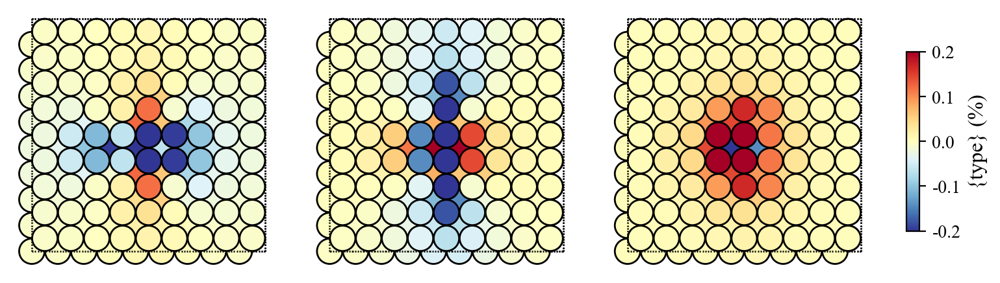

In [57]:
visiual_atoms_strain_3d(bulk_md, strain_field_is, input_range=[-0.002, 0.002])

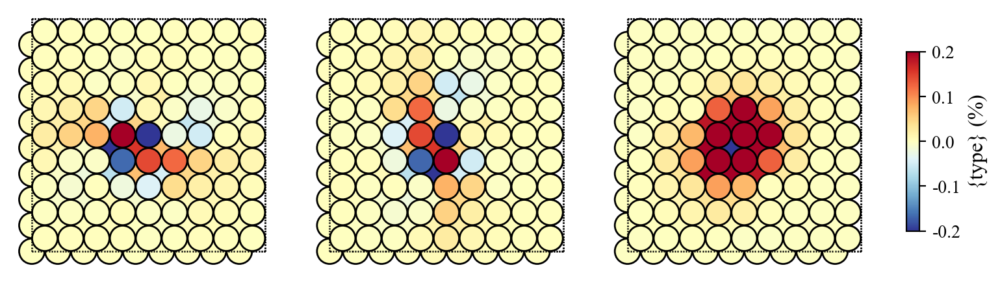

In [58]:
bulk_md_path = join(in_bulk_path_md_copy,'neb','tetra')
# sort_lammps_data(join(bulk_md_path, 'bulk.data'), join(bulk_md_path, 'sorted_bulk.data'))
ts_tetra = read(join(bulk_md_path, 'neb_path.lammpstrj.19000'), format='lammps-dump-text')
ss = strain_system(bulk_md2, ts_tetra, ads_list=[-1] )
strain_field_ts = ss.get_strain()
visiual_atoms_strain_3d(bulk_md, strain_field_ts, input_range=[-0.002, 0.002])

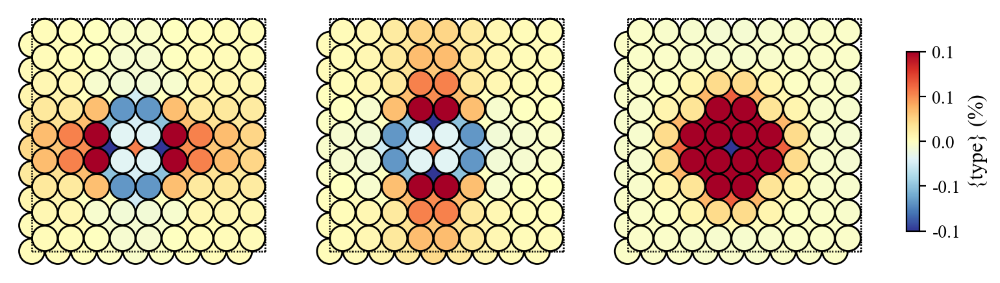

In [59]:
bulk_md_path = join(in_bulk_path_md_copy,'ts_octa')
sort_lammps_data(join(bulk_md_path, 'bulk.data'), join(bulk_md_path, 'sorted_bulk.data'))
ts_octa = read(join(bulk_md_path, 'sorted_bulk.data'), format='lammps-data', style='atomic',Z_of_type=Z_of_type1)
ss = strain_system(bulk_md2, ts_octa, ads_list=[-1] )
part2 = ss.get_strain()
visiual_atoms_strain_3d(bulk_md, part2, input_range=[-0.001, 0.001])
# visiual_atoms_strain_3d(bulk_md, part2)

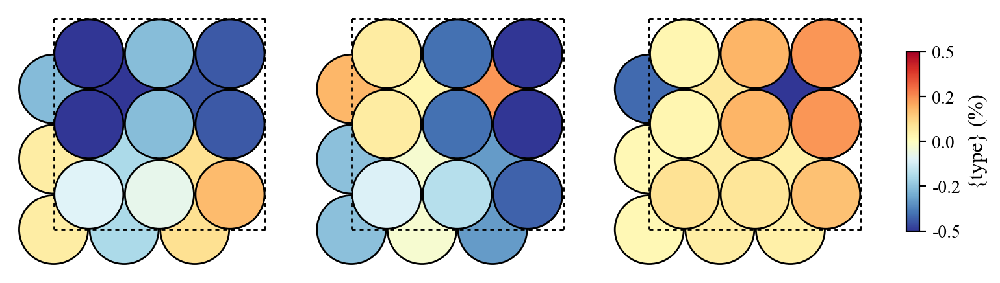

In [60]:
# initial state
ss = strain_system(bulk_model, interval_tetrahedral_is, ads_list=[-1] )
part2 = ss.get_strain()
visiual_atoms_strain_3d(bulk_model, part2, input_range=[-0.005, 0.005])
# visiual_atoms_strain_3d(bulk_model, part2)

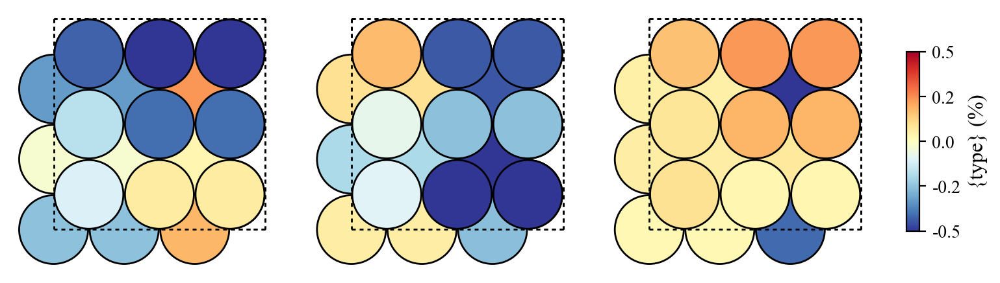

In [61]:
# final state
ss = strain_system(bulk_model, tetra_tetra_neb[-1], ads_list=[-1] )
part2 = ss.get_strain()
visiual_atoms_strain_3d(bulk_model, part2, input_range=[-0.005, 0.005])
# visiual_atoms_strain_3d(bulk_model, part2)

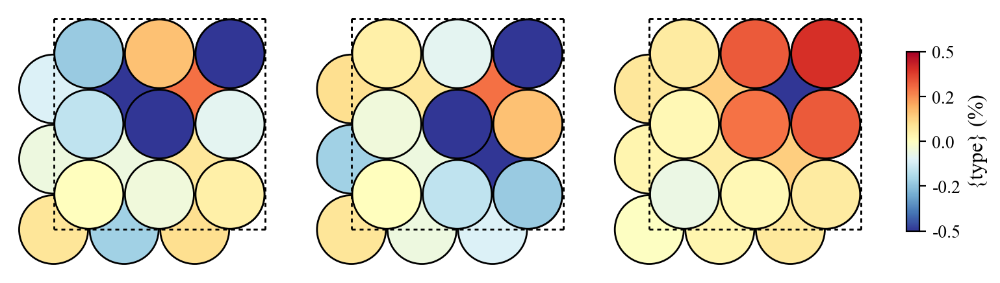

In [62]:
# transition state
ss = strain_system(bulk_model, tetra_tetra_neb[2], ads_list=[-1] )
part2 = ss.get_strain()
visiual_atoms_strain_3d(bulk_model, part2, input_range=[-0.005, 0.005])
# visiual_atoms_strain_3d(bulk_model, part2)

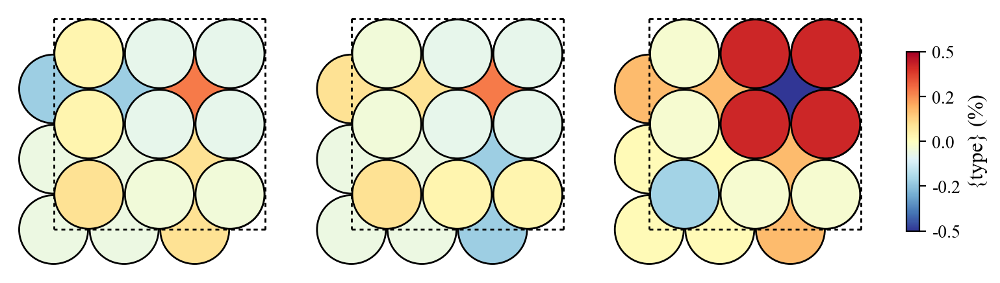

In [63]:
#
ss = strain_system(bulk_model, interval_octahedral, ads_list=[-1] )
part2 = ss.get_strain()
visiual_atoms_strain_3d(bulk_model, part2,input_range=[-0.005, 0.005])

In [64]:
# 原子坐标和对应值
pos = bulk_md.get_positions()
pos2 = pos.copy()
cell = bulk_md.get_cell()
cell_z = cell[-1][-1]/2
pos[pos2[:,-1]<cell_z, -1] = pos2[pos2[:,-1]<cell_z, -1]+cell_z
pos[pos2[:,-1]>cell_z, -1] = pos2[pos2[:,-1]>cell_z, -1]-cell_z

save_data_to_hdf5('./esh3d-master/strain_field_is.h5', bulk_md, strain_field_is)
save_data_to_hdf5('./esh3d-master/strain_field_ts.h5', bulk_md, strain_field_ts)

# strain

In [65]:
strain_symbal_dict = {'xy':[1,1,0], 'z':[0,0,1],}
# 等三轴应变，y轴应变 和 z轴应变
positive_negativate = {'p1':1, 'n1':-1, 'p2':0.5, 'n2':-0.5, }
max_strain = 0.04

strain_dict = {}
for stain_key in strain_symbal_dict:

    strain_symbal = strain_symbal_dict[stain_key]
    for pn_key in positive_negativate:
        pn_value = positive_negativate[pn_key]
        strain_ = strain_symbal.copy()
        key = stain_key+'_' + pn_key
        strain_dict[key] =  np.array(strain_)*max_strain/len(stain_key)*pn_value
strain_dict

{'xy_p1': array([0.02, 0.02, 0.  ]),
 'xy_n1': array([-0.02, -0.02, -0.  ]),
 'xy_p2': array([0.01, 0.01, 0.  ]),
 'xy_n2': array([-0.01, -0.01, -0.  ]),
 'z_p1': array([0.  , 0.  , 0.04]),
 'z_n1': array([-0.  , -0.  , -0.04]),
 'z_p2': array([0.  , 0.  , 0.02]),
 'z_n2': array([-0.  , -0.  , -0.02])}

In [66]:
strain_bulk = {}
for strain_key in strain_dict:
    strain = strain_dict[strain_key]
    bulk = bulk_model.copy()
    strain_bulk[strain_key], part2 = opt_strain_F(bulk, strain)

strain_bulk_path = join(savepath,'strain_bulk')
out_car_list(strain_bulk, path=strain_bulk_path)
len(strain_bulk)

8

In [67]:
strain_bulk_copy = join(savepath,'strain_bulk_copy')
strain_bulk = read_car(strain_bulk_copy, car="CONTCAR")
strain_bulk_e = read_car(strain_bulk_copy, car="OSZICAR")

strain_bulk_e_d = strain_bulk_e[1]
strain_bulk_e_d['0'] = bulk_e
strain_bulk_e_d

1st dict_keys(['xyz_n', 'xyz_p', 'xy_n', 'xy_n1', 'xy_n2', 'xy_p', 'xy_p1', 'xy_p2', 'z_n', 'z_n1', 'z_n2', 'z_p', 'z_p1', 'z_p2'])
E0 value: -1 F   -.50875768E+03
E0 value: -1 F   -.50960865E+03
E0 value: -1 F   -.51089446E+03
E0 value: -1 F   -.51223626E+03
E0 value: -1 F   -.51300314E+03
E0 value: -1 F   -.51133111E+03
E0 value: -1 F   -.51238780E+03
E0 value: -1 F   -.51303562E+03
E0 value: -1 F   -.51242352E+03
E0 value: -1 F   -.51172636E+03
E0 value: -1 F   -.51289529E+03
E0 value: -1 F   -.51251830E+03
E0 value: -1 F   -.51195861E+03
E0 value: -1 F   -.51292578E+03
1st dict_keys(['xyz_n', 'xyz_p', 'xy_n', 'xy_n1', 'xy_n2', 'xy_p', 'xy_p1', 'xy_p2', 'z_n', 'z_n1', 'z_n2', 'z_p', 'z_p1', 'z_p2'])


{'xyz_n': -508.75768,
 'xyz_p': -509.60865,
 'xy_n': -510.89446,
 'xy_n1': -512.23626,
 'xy_n2': -513.00314,
 'xy_p': -511.33111,
 'xy_p1': -512.3878,
 'xy_p2': -513.03562,
 'z_n': -512.42352,
 'z_n1': -511.72636,
 'z_n2': -512.89529,
 'z_p': -512.5183,
 'z_p1': -511.95861,
 'z_p2': -512.92578,
 '0': -513.25283}

In [68]:
bulk_dict ={'tetra_1':interval_tetrahedral_is,
            'tetra_2':interval_tetrahedral_fs,
            'octa': interval_octahedral}
in_strain_bulk = {}
for strain_key in strain_dict:
    strain = strain_dict[strain_key]

    for bulk_key in bulk_dict.keys():
        bulk = bulk_dict[bulk_key].copy()
        strain_bulk_key = f'{bulk_key}_{strain_key}'
        in_strain_bulk[strain_bulk_key], part2 = opt_strain_F(bulk, strain)
    print(strain_key)
    print(part2)
in_strain_bulk_path = join(savepath,'in_strain_bulk')
out_car_list(in_strain_bulk, path=in_strain_bulk_path)
len(in_strain_bulk)

xy_p1
[[ 2.00000000e-02  6.16297582e-33 -6.16297582e-33]
 [ 6.16297582e-33  2.00000000e-02 -6.16297582e-33]
 [-6.16297582e-33 -6.16297582e-33  0.00000000e+00]]
xy_n1
[[-2.00000000e-02 -6.16297582e-33  6.16297582e-33]
 [-6.16297582e-33 -2.00000000e-02  6.16297582e-33]
 [ 6.16297582e-33  6.16297582e-33  0.00000000e+00]]
xy_p2
[[0.01 0.   0.  ]
 [0.   0.01 0.  ]
 [0.   0.   0.  ]]
xy_n2
[[-0.01  0.    0.  ]
 [ 0.   -0.01  0.  ]
 [ 0.    0.    0.  ]]
z_p1
[[0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.04]]
z_n1
[[ 0.    0.    0.  ]
 [ 0.    0.    0.  ]
 [ 0.    0.   -0.04]]
z_p2
[[0.   0.   0.  ]
 [0.   0.   0.  ]
 [0.   0.   0.02]]
z_n2
[[ 0.    0.    0.  ]
 [ 0.    0.    0.  ]
 [ 0.    0.   -0.02]]


24

In [69]:
in_strain_bulk_copy_path = join(savepath,'in_strain_bulk_copy') # 存储初态和末态的地址 input_path

strain_neb_path = join(savepath,'strain_neb_diffusion') # 输出neb的地址 output_path
create_folder(strain_neb_path, is_delete=True)

tetra_tetra_neb_path = join(strain_neb_path, 'tetra_tetra')
create_folder(tetra_tetra_neb_path, is_delete=True)

strain_neb_name = [
            ['tetra_1_xy_p1','tetra_2_xy_p1'],
            ['tetra_1_xy_n1','tetra_2_xy_n1'],
            ['tetra_1_z_p1','tetra_2_z_p1'],
            ['tetra_1_z_n1','tetra_2_z_n1'],
            ['tetra_1_xy_p2','tetra_2_xy_p2'],
            ['tetra_1_xy_n2','tetra_2_xy_n2'],
            ['tetra_1_z_p2','tetra_2_z_p2'],
            ['tetra_1_z_n2','tetra_2_z_n2'],
            ] # 构成neb的队列

neb_diffusion_l,neb_diffusion_d  = create_neb(in_strain_bulk_copy_path, strain_neb_name, tetra_tetra_neb_path)

True
delete /media/zwbai/DATA/strain/Cr_H2/strain_neb_diffusion
folder '/media/zwbai/DATA/strain/Cr_H2/strain_neb_diffusion' is created
folder '/media/zwbai/DATA/strain/Cr_H2/strain_neb_diffusion/tetra_tetra' is created


TypeError: stat: path should be string, bytes, os.PathLike or integer, not list

In [ ]:
tetra_octa_neb_path = join(strain_neb_path, 'tetra_octa')
create_folder(tetra_octa_neb_path, is_delete=True)

strain_neb_name = [
            ['tetra_1_xy_p1','octa_xy_p1'],
            ['tetra_1_xy_n1','octa_xy_n1'],
            ['tetra_1_z_p1','octa_z_p1'],
            ['tetra_1_z_n1','octa_z_n1'],
            ['tetra_1_xy_p2','octa_xy_p2'],
            ['tetra_1_xy_n2','octa_xy_n2'],
            ['tetra_1_z_p2','octa_z_p2'],
            ['tetra_1_z_n2','octa_z_n2'],
            ] # 构成neb的队列

neb_diffusion_l,neb_diffusion_d  = create_neb(in_strain_bulk_copy_path, strain_neb_name, tetra_octa_neb_path, n_mage_prepared=5)

folder '/media/zwbai/DATA/strain/Cr_H2/strain_neb_diffusion/tetra_octa' is created


TypeError: stat: path should be string, bytes, os.PathLike or integer, not list

In [70]:
# strain neb result
strain_neb_result_path = join(savepath,'strain_neb_diffusion_copy')
strain_neb_tetra_path = join(strain_neb_result_path,'tetra_tetra')
strain_neb_tetra_result = read_cars(strain_neb_tetra_path, car="CONTCAR")
strain_neb_tetra_e =  read_cars(strain_neb_tetra_path, car="OSZICAR")

strain_neb_tetra_result[1]['tetra_1_0-tetra_2_0'] = tetra_tetra_neb_d
strain_neb_tetra_e[1]['tetra_1_0-tetra_2_0'] = tetra_tetra_neb_e_d
strain_neb_tetra_result[0].append(tetra_tetra_neb)
strain_neb_tetra_e[0].append(tetra_tetra_neb_e)

strain_neb_octa_path = join(strain_neb_result_path,'tetra_octa')
strain_neb_octa_result = read_cars(strain_neb_octa_path, car="CONTCAR")
strain_neb_octa_e =  read_cars(strain_neb_octa_path, car="OSZICAR")

strain_neb_octa_result[1]['tetra_1_0-octa_0'] = tetra_octa_neb_d
strain_neb_octa_e[1]['tetra_1_0-octa_0'] = tetra_octa_neb_e_d
strain_neb_octa_result[0].append(tetra_octa_neb)
strain_neb_octa_e[0].append(tetra_octa_neb_e)

/media/zwbai/DATA/strain/Cr_H2/strain_neb_diffusion_copy/tetra_tetra/CONTCARS.pkl
dict_keys(['tetra_1_xy_n1-tetra_2_xy_n1', 'tetra_1_xy_n2-tetra_2_xy_n2', 'tetra_1_xy_p1-tetra_2_xy_p1', 'tetra_1_xy_p2-tetra_2_xy_p2', 'tetra_1_z_n1-tetra_2_z_n1', 'tetra_1_z_n2-tetra_2_z_n2', 'tetra_1_z_p1-tetra_2_z_p1', 'tetra_1_z_p2-tetra_2_z_p2'])
/media/zwbai/DATA/strain/Cr_H2/strain_neb_diffusion_copy/tetra_tetra/OSZICARS.pkl
dict_keys(['tetra_1_xy_n1-tetra_2_xy_n1', 'tetra_1_xy_n2-tetra_2_xy_n2', 'tetra_1_xy_p1-tetra_2_xy_p1', 'tetra_1_xy_p2-tetra_2_xy_p2', 'tetra_1_z_n1-tetra_2_z_n1', 'tetra_1_z_n2-tetra_2_z_n2', 'tetra_1_z_p1-tetra_2_z_p1', 'tetra_1_z_p2-tetra_2_z_p2'])
/media/zwbai/DATA/strain/Cr_H2/strain_neb_diffusion_copy/tetra_octa/CONTCARS.pkl
dict_keys(['tetra_1_xy_n1-octa_xy_n1', 'tetra_1_xy_n2-octa_xy_n2', 'tetra_1_xy_p1-octa_xy_p1', 'tetra_1_xy_p2-octa_xy_p2', 'tetra_1_z_n1-octa_z_n1', 'tetra_1_z_n2-octa_z_n2', 'tetra_1_z_p1-octa_z_p1', 'tetra_1_z_p2-octa_z_p2'])
/media/zwbai/DATA/strai

In [71]:
H_e = read_one_car(join(savepath,'H_copy'), car="OSZICAR") # H原子的能量

E0 value: -1 F   -.97579947E+00


xy_n1
xy_n2
xy_p1
xy_p2
z_n1
z_n2
z_p1
z_p2
0
Error processing 0: list index out of range


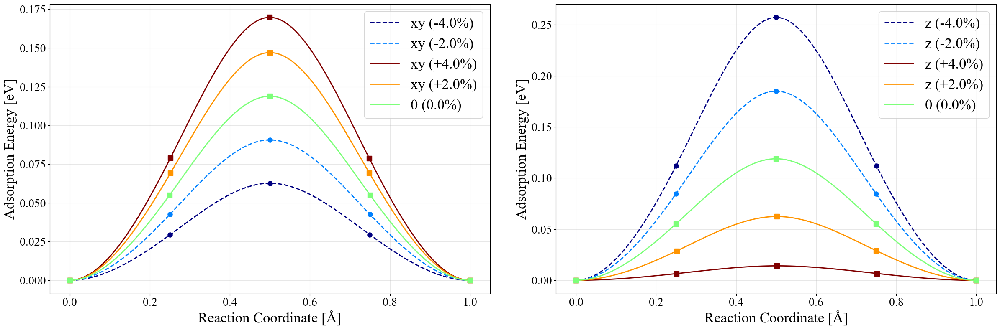

In [72]:
neb_strain_line = {}
# 数据收集
all_data = []
zero_data = []
numeric_values = []  # 用于存储所有part4的数值

for index, (key, neb) in enumerate(strain_neb_tetra_result[1].items()):
    neb_x = get_dist_list(strain_neb_tetra_result[0][index])
    neb_e = strain_neb_tetra_e[0][index]
    neb_e = np.array(neb_e)
    k = key.split('-')[-1].split('_')[2:]
    if len(k) ==2:
        k = f'{k[0]}_{k[1]}'
    else:
        k = '0'
    print(k)
    neb_e0 = neb_e -strain_bulk_e_d[k]# - neb_e[0]
    neb_e0 = neb_e0 - neb_e0[0]
    neb_x_scaler = [x/max(neb_x) for x in neb_x]

    x_interp, y_interp = interpolate_plot(neb_x_scaler, neb_e0, is_plot=False)

    part1 = key.split('-')[1]
    part2 = part1.split('tetra_2_')[1]
    part3 = part2.split('_')[0]

    if part3 not in neb_strain_line.keys() and part3 != '0':
        neb_strain_line[part3] = np.zeros(3)
        neb_strain_line[part3][0] = neb_e0[2]
    elif part3 == '0':
        for k in neb_strain_line.keys():
            neb_strain_line[k][1] = neb_e0[2]
    else:
        neb_strain_line[part3][2] = neb_e0[2]

    # 解析part4数值
    try:
        part4 = part2.split('_')[1]
        prefix = part4[0].lower()
        value = int(part4[1:])
        numeric_value = -value if prefix == 'n' else value
        numeric_value = 1/numeric_value*0.04
        numeric_values.append(numeric_value)
    except Exception as e:
        print(f"Error processing {part2}: {e}")
        numeric_value = 0  # 异常值处理

    # 线型处理
    ls = '--' if prefix == 'n' else '-'
    ps = 'o' if prefix == 'n' else 's'

    # 保存数据
    data_entry = {
        'part2': part2,
        'part3': part3,
        'neb_x_scaler': neb_x_scaler,
        'neb_e': neb_e,
        'neb_e0': neb_e0,
        'x_interp': x_interp,
        'y_interp': y_interp,
        'ps': ps,
        'ls': ls,
        'label': f"{part3} ({'+' if numeric_value>0 else ''}{numeric_value * 100:.1f}%)",
        'numeric_value': numeric_value
    }

    if part3 == '0':
        zero_data.append(data_entry)
    else:
        all_data.append(data_entry)

# 创建颜色映射
min_val = min(numeric_values)
max_val = max(numeric_values)
norm = plt.Normalize(vmin=min_val, vmax=max_val)
cmap = plt.colormaps['jet'] # 使用红蓝渐变色系

# 创建分组（示例按part3分成两组）
non_zero_part3 = sorted(list({d['part3'] for d in all_data}))
group1_part3 = non_zero_part3[:len(non_zero_part3)//2]
group2_part3 = non_zero_part3[len(non_zero_part3)//2:]

# 创建带颜色条的两幅图
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 8))

# 绘制第一组
for data in all_data + zero_data:
    if data['part3'] in group1_part3 or data['part3'] == '0':
        color = cmap(norm(data['numeric_value']))
        ax1.plot(data['neb_x_scaler'], data['neb_e0'], data['ps'],
                color=color, markersize=8)
        ax1.plot(data['x_interp'], data['y_interp'],
                color=color, linestyle=data['ls'],
                linewidth=2, label=data['label'])

# 绘制第二组
for data in all_data + zero_data:
    if data['part3'] in group2_part3 or data['part3'] == '0':
        color = cmap(norm(data['numeric_value']))
        ax2.plot(data['neb_x_scaler'], data['neb_e0'], data['ps'],
                color=color, markersize=8)
        ax2.plot(data['x_interp'], data['y_interp'],
                color=color, linestyle=data['ls'],
                linewidth=2, label=data['label'])

# 公共设置
for ax in [ax1, ax2]:
    ax.set_ylabel("Adsorption Energy [eV]", fontsize=25)
    ax.set_xlabel("Reaction Coordinate [Å]", fontsize=25)
    ax.legend(loc='best',fontsize=25)
    ax.grid(True, alpha=0.3)

    ax.tick_params(axis='both', which='major', labelsize=20)
plt.tight_layout()
plt.subplots_adjust(wspace=0.15)
plt.show()

# 扩散路径能量和应变的关系

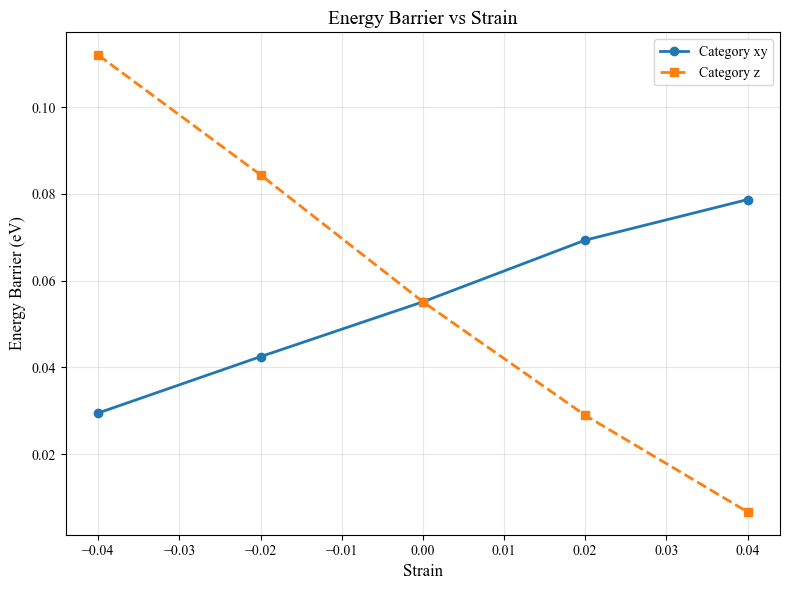

In [73]:
tetra_start = {}
tetra_middel = {}
tetra_barrier = {}
strain_x = {}
for i in range(len(all_data)):
    key = (all_data[i]['part3'])
    # print(all_data[i])
    # print(all_data[i]['neb_e0'][3])
    if key not in tetra_barrier.keys():
        tetra_start[key] = []
        tetra_middel[key] = []
        tetra_barrier[key] = []
        strain_x[key] = []
    tetra_barrier[key].append(all_data[i]['neb_e0'][3])
    strain_x[key].append(all_data[i]['numeric_value'])
    tetra_start[key].append(all_data[i]['neb_e'][0] - strain_bulk_e_d[all_data[i]['part2']] - H_e)
    tetra_middel[key].append(all_data[i]['neb_e'][3] - strain_bulk_e_d[all_data[i]['part2']] - H_e)
for key in tetra_barrier.keys():
    tetra_start[key].insert(2, zero_data[0]['neb_e'][0] - strain_bulk_e_d[zero_data[0]['part2']] - H_e)
    tetra_middel[key].insert(2, zero_data[0]['neb_e'][3] - strain_bulk_e_d[zero_data[0]['part2']] - H_e)
    tetra_barrier[key].insert(2, zero_data[0]['neb_e0'][3])
    strain_x[key].insert(2, 0)

# 在现有代码基础上添加排序逻辑
for key in tetra_barrier.keys():
    # 将x和y组合并按x排序
    combined = sorted(zip(strain_x[key], tetra_barrier[key], tetra_start[key], tetra_middel[key]))
    sorted_x, sorted_y, sorted_s, sorted_m = zip(*combined)  # 解压排序后的数据

    # 更新字典中的值为排序后的数据
    strain_x[key] = list(sorted_x)
    tetra_barrier[key] = list(sorted_y)
    tetra_start[key] = list(sorted_s)
    tetra_middel[key] = list(sorted_m)

# 绘图
plt.figure(figsize=(8, 6))

# 为每个键绘制曲线
# colors = ['b', 'r']  # 假设最多两条线
for idx, key in enumerate(tetra_barrier):
    plt.plot(strain_x[key],
             tetra_barrier[key],
             marker='o' if idx % 2 == 0 else 's',  # 偶数索引使用圆点，奇数索引使用方块
             linestyle='-' if idx % 2 == 0 else '--',  # 偶数索引使用实线，奇数索引使用虚线
             linewidth = 2,
             markersize = 6,
             label=f'Category {key}')  # 根据实际情况修改标签

plt.xlabel('Strain', fontsize=12)
plt.ylabel('Energy Barrier (eV)', fontsize=12)
plt.title('Energy Barrier vs Strain', fontsize=14)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# 势垒和应变的关系

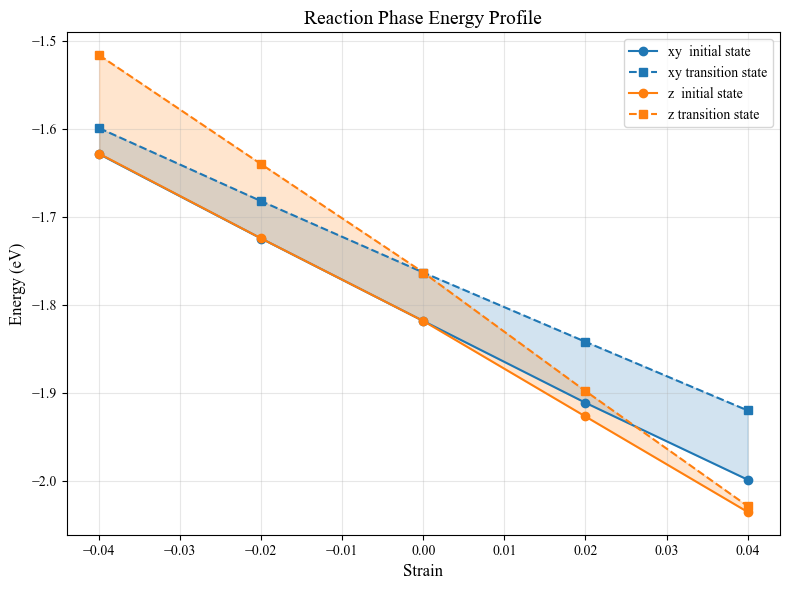

In [74]:
plt.figure(figsize=(8, 6))
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

# 定义统一的线型和标记样式
line_styles = {
    'tetra_start': {'marker': 'o', 'ls': '-', 'label_suffix': '  initial state'},
    'tetra_middel': {'marker': 's', 'ls': '--', 'label_suffix': ' transition state'}
}

for idx, key in enumerate(tetra_barrier):
    color = colors[idx % len(colors)]

    # 绘制填充区域
    plt.fill_between(
        strain_x[key],
        tetra_start[key],
        tetra_middel[key],
        color=color,
        alpha=0.2
    )

    # 绘制两条边界线
    for boundary in ['tetra_start', 'tetra_middel']:
        plt.plot(
            strain_x[key],
            locals()[boundary][key],  # 动态获取对应数据集
            color=color,
            marker=line_styles[boundary]['marker'],
            linestyle=line_styles[boundary]['ls'],
            linewidth=1.5,
            markersize=6,
            label=f'{key}{line_styles[boundary]["label_suffix"]}'
        )

plt.xlabel('Strain', fontsize=12)
plt.ylabel('Energy (eV)', fontsize=12)
plt.title('Reaction Phase Energy Profile', fontsize=14)
plt.grid(True, alpha=0.3)

# 优化图例显示
handles, labels = plt.gca().get_legend_handles_labels()
# 去重处理（避免重复标签）
unique = [(h, l) for i, (h, l) in enumerate(zip(handles, labels)) if l not in labels[:i]]
plt.legend(*zip(*unique), loc='best')

plt.tight_layout()
plt.show()
# 初态和过渡态能量和应变的关系

In [107]:
md_neb = join(in_bulk_path_md_copy, 'neb/tetra6/results/')
is_eigen_force = -extract_atoms_data(join(md_neb,'dump.force.1.xyz'), order=0)[:,2:]# 本征应力需要取负号
ts_eigen_force = -extract_atoms_data(join(md_neb,'dump.force.2.xyz'), order=0)[:,2:]
is_eigen_stress = -extract_atoms_data(join(md_neb,'dump.stress.1.xyz'), order=0)[:,2:]
ts_eigen_stress = -extract_atoms_data(join(md_neb,'dump.stress.2.xyz'), order=0)[:,2:]

is_eigen_force_field = covert6to3d(is_eigen_force)*0.1 # bar转为MPa
ts_eigen_force_field = covert6to3d(ts_eigen_force)*0.1
is_eigen_stress_field = covert6to3d(is_eigen_stress)*0.1
ts_eigen_stress_field = covert6to3d(ts_eigen_stress)*0.1

is_force = -extract_atoms_data(join(md_neb,'dump.force.1.xyz'))[:,2:]
ts_force = -extract_atoms_data(join(md_neb,'dump.force.2.xyz'))[:,2:]
is_stress = -extract_atoms_data(join(md_neb,'dump.stress.1.xyz'))[:,2:]
ts_stress = -extract_atoms_data(join(md_neb,'dump.stress.2.xyz'))[:,2:]

1 MPa·Å³ = (10⁶ Pa) × (10⁻³⁰ m³)
         = 10⁶ × 10⁻³⁰ Pa·m³
         = 10⁻²⁴ J
转换为 eV：

10⁻²⁴ J ÷ (1.60217662 × 10⁻¹⁹ J/eV) 
= 10⁻²⁴ / 1.60217662 × 10⁻¹⁹
= 10⁻⁵ / 1.60217662
≈ 6.241509 × 10⁻⁶ eV

In [76]:
print(is_eigen_force_field[-1])
print(ts_eigen_force_field[-1])
# 初态的本征应力，和过渡态的本征应力, 已经乘了夹杂体积
is_xx_yy  = (is_eigen_force_field[-1][0,0] + is_eigen_force_field[-1][1,1])/2
is_zz = is_eigen_force_field[-1][2,2]
ts_xx_yy  = (ts_eigen_force_field[-1][0,0] + ts_eigen_force_field[-1][1,1])/2
ts_zz = ts_eigen_force_field[-1][2,2]

tetra_barrier['xy_predict'] = np.array([-(ts_xx_yy - is_xx_yy)*0.02 * i * 6.241509E-6 for i in range(-2,3)]) + tetra_barrier['xy'][2] # 单位转换为eV/atom
tetra_barrier['z_predict'] =  np.array([-(ts_zz - is_zz)*0.02 * i * 6.241509E-6 for i in range(-2,3)]) + tetra_barrier['xy'][2] # 单位转换为eV/atom

[[ 3.09594e+05  9.42976e-11  1.88296e-09]
 [ 9.42976e-11  4.04788e+05 -5.96723e-10]
 [ 1.88296e-09 -5.96723e-10  4.04788e+05]]
[[ 2.78915e+05  2.04573e+05 -1.92914e-09]
 [ 2.04573e+05  2.78915e+05 -1.99230e-09]
 [-1.92914e-09 -1.99230e-09  6.23011e+05]]


In [77]:
strain_x_ = [-0.04, -0.02, 0, 0.02, 0.04]
strain_x_, tetra_barrier[key]

([-0.04, -0.02, 0, 0.02, 0.04],
 [0.11201000000005479,
  0.08438999999998487,
  0.055110000000013315,
  0.02891999999997097,
  0.006650000000036016])

The interaction potential energy between applied strain and inclusion enignstress：
$$
E_{\mathrm{int} } = -\int_{V_{1} }^{} \sigma _{ij}^{*}
\left ( x \right )\varepsilon _{ij}^{0}\left ( x \right ) dx
$$

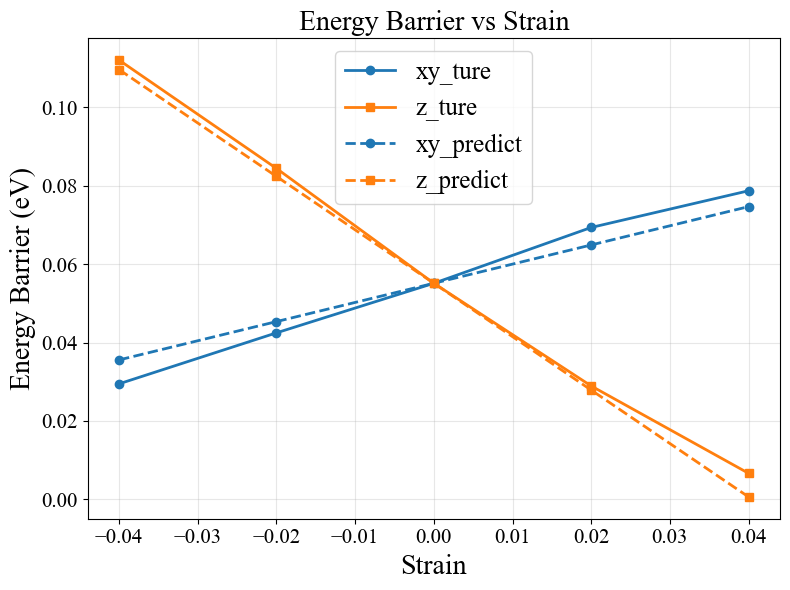

In [118]:
plt.figure(figsize=(8, 6))

# 为每个键绘制曲线
# colors = ['b', 'r']  # 假设最多两条线
for idx, key in enumerate(tetra_barrier):

    key_ = f'{key}_ture' if key[-1] != 't' else key
    plt.plot(np.array(strain_x_),
             np.array(tetra_barrier[key]),
             marker='o' if idx % 2 == 0 else 's',  # 偶数索引使用圆点，奇数索引使用方块
             linestyle='-' if idx <2 else '--',  # 偶数索引使用实线，奇数索引使用虚线
             color = colors[idx % 2],
             linewidth = 2,
             markersize = 6,
             label=f'{key_}')  # 根据实际情况修改标签

plt.xlabel('Strain', fontsize=20)
plt.ylabel('Energy Barrier (eV)', fontsize=20)
plt.title('Energy Barrier vs Strain', fontsize=20)
plt.grid(True, alpha=0.3)
plt.legend(loc='upper center',fontsize=18)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.tight_layout()
plt.show()
# 本征应力和施加应变的相互作用 和 势垒和施加应变的相互作用 对比

In [104]:
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec

def visiual_atoms_strain_3d(atoms, strain, isnormal=False, input_range=None, type='strain', units=None, layers=3):
    plt.rcParams.update({'font.size': 10})

    # 主网格布局：1行4列，最后一列单独处理
    fig = plt.figure(dpi=200, figsize=(9, 3))
    main_gs = GridSpec(1, 4, width_ratios=[1, 1, 1, 0.05], wspace=0.2)  # 前三列等宽，第四列窄

    # 前三列放置原子图
    ax1 = fig.add_subplot(main_gs[0, 0])
    ax2 = fig.add_subplot(main_gs[0, 1])
    ax3 = fig.add_subplot(main_gs[0, 2])
    axs = [ax1, ax2, ax3]

    # 第四列内部嵌套3行网格（上留白、颜色条、下留白）
    inner_gs = GridSpecFromSubplotSpec(3, 1, height_ratios=[1, 3, 1], subplot_spec=main_gs[0, 3], hspace=0)
    cax = fig.add_subplot(inner_gs[1, 0])  # 中间行用于颜色条

    strain_symbol = ['x', 'y', 'z']

    pos = atoms.get_positions()
    sz = sort_z(pos[:,-1])
    atoms_z = atoms[sz>max(sz)-layers]

    for i in range(3):
        ax = axs[i]
        s = strain[:, i, i]
        cmap = plt.colormaps['RdYlBu'].reversed()

        # 归一化逻辑
        if isnormal:
            norm = mcolors.Normalize(vmin=strain.min(), vmax=strain.max())
        else:
            if input_range is None:
                vmin = s.min()
                vmax = s.max()
                if (vmax - vmin) < 1e-3:
                    vmax += 1e-3
                    vmin -= 1e-3
                abs_max = max(abs(vmin), abs(vmax))
                input_range = [-abs_max, abs_max]
            norm = mcolors.Normalize(vmin=input_range[0], vmax=input_range[1])

        colors = np.array([cmap(norm(value)) for value in s])
        colors_sz = colors[sz>max(sz)-layers]

        Matplotlib(atoms_z, ax, colors=colors_sz).write() # 仅仅画了垂直于方向的三层原子

        # Matplotlib(atoms_z, ax, colors=colors_sz).write()

        # 设置标题
        subscript = f'{strain_symbol[i]}{strain_symbol[i]}'
        if type == 'strain':
            title = r'$\varepsilon _{' + subscript + '}$'
        elif type == 'stress':
            r'$\sigma _{' + subscript + '}$'
        elif type[0] == 'v':
            title = r'$W _{' + subscript + '}$'
        else:
            title = subscript
        print(title)
        ax.set_title(title, fontsize=15)
        ax.set_axis_off()

    # 仅在最后一个循环外添加颜色条（避免重复）
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])

    if type == 'strain':
        cbar = fig.colorbar(sm, cax=cax, orientation='vertical', aspect=15)
        cbar.set_label(r'{type} (%)', size=12)
        cbar.ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x*100:.1f}'))
    else:
        cbar = fig.colorbar(sm, cax=cax, orientation='vertical', aspect=15)
        if units is None:
            symbel_units = f'{type} (GPa)'
            cbar.ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:.1f}'))
        else:
            symbel_units = f'{type} ({units})'
            # cbar.ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f"{x:.1e}"))
        cbar.set_label(symbel_units, size=12)


    cbar.ax.tick_params(labelsize=10)

    plt.show()

$W _{xx}$
$W _{yy}$
$W _{zz}$


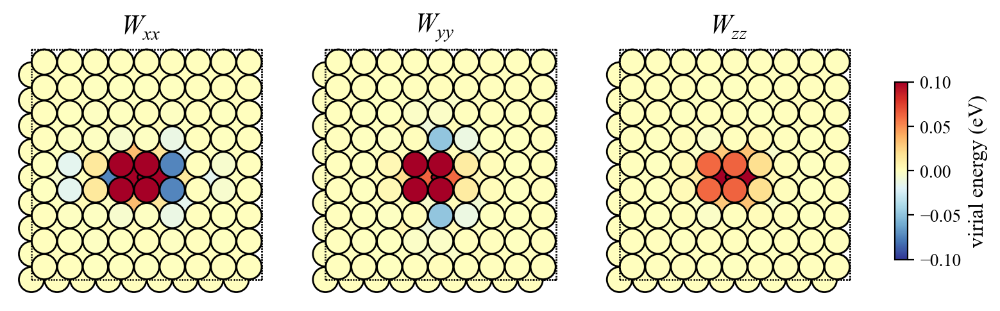

In [105]:
visiual_atoms_strain_3d(bulk_tetrahedral_1_md, is_eigen_force_field*6.241509e-6, input_range=[-0.1, 0.1], type='virial energy', units='eV')

$W _{xx}$
$W _{yy}$
$W _{zz}$


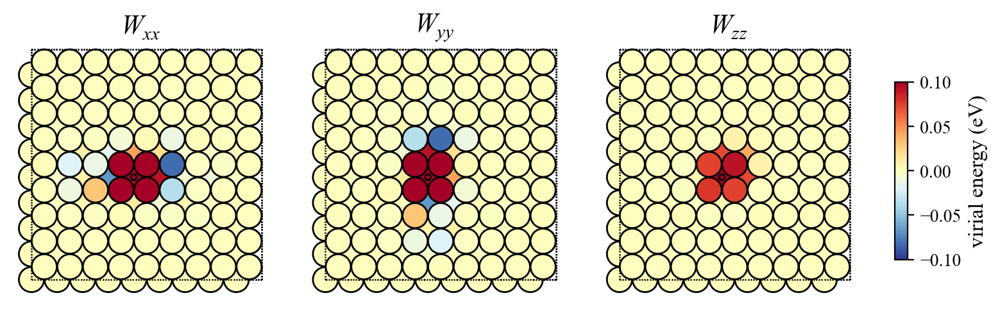

In [108]:
visiual_atoms_strain_3d(bulk_octahedral_md, ts_eigen_force_field*6.241509e-6, input_range=[-0.1, 0.1], type='virial energy', units='eV')

Error processing 0: list index out of range


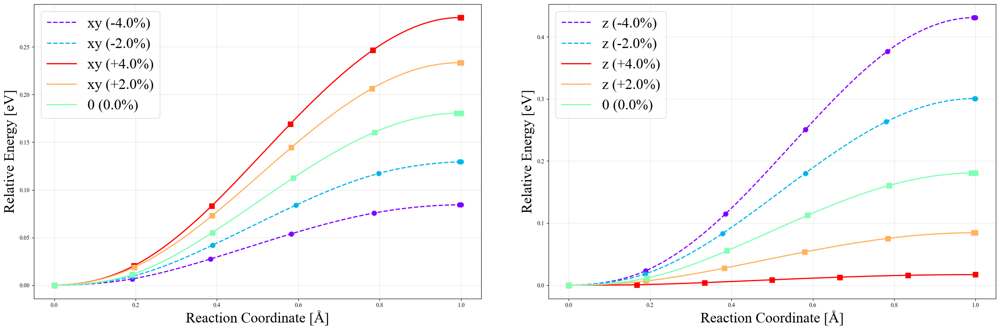

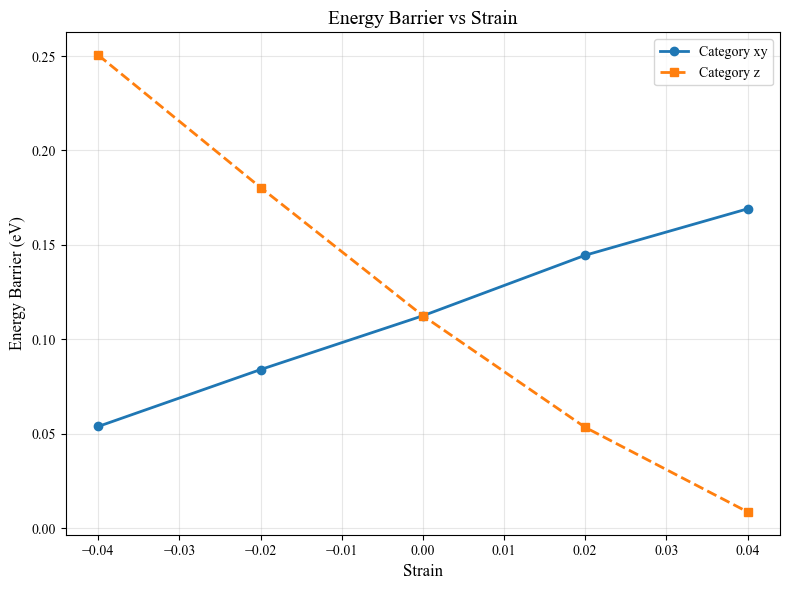

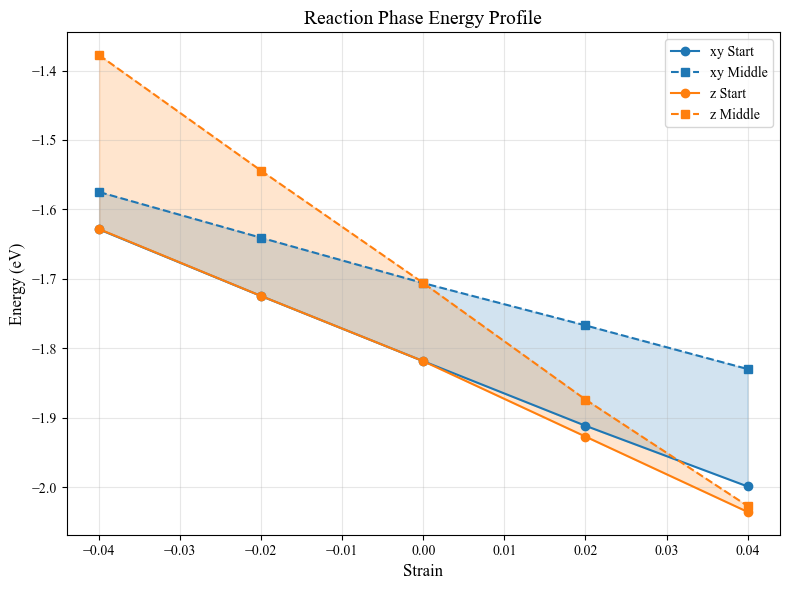

In [81]:

neb_strain_line = {}

# 数据收集阶段
all_data = []
zero_data = []
numeric_values = []  # 用于存储所有part4的数值

for index, (key, neb) in enumerate(strain_neb_octa_result[1].items()):
    neb_x = get_dist_list(strain_neb_octa_result[0][index])
    neb_e = strain_neb_octa_e[0][index]
    neb_e = np.array(neb_e)
    neb_e0 = neb_e - neb_e[0]
    neb_x_scaler = [x/max(neb_x) for x in neb_x]

    x_interp, y_interp = interpolate_plot(neb_x_scaler, neb_e0, is_plot=False)

    part1 = key.split('-')[1]
    part2 = part1.split('octa_')[1]
    part3 = part2.split('_')[0]

    if part3 not in neb_strain_line.keys() and part3 != '0':
        neb_strain_line[part3] = np.zeros(3)
        neb_strain_line[part3][0] = neb_e0[2]
    elif part3 == '0':
        for k in neb_strain_line.keys():
            neb_strain_line[k][1] = neb_e0[2]
    else:
        neb_strain_line[part3][2] = neb_e0[2]

    # 解析part4数值
    try:
        part4 = part2.split('_')[1]
        prefix = part4[0].lower()
        value = int(part4[1:])
        numeric_value = -value if prefix == 'n' else value
        numeric_value = 1/numeric_value*0.04
        numeric_values.append(numeric_value)
    except Exception as e:
        print(f"Error processing {part2}: {e}")
        numeric_value = 0  # 异常值处理

    # 线型处理
    ls = '--' if prefix == 'n' else '-'
    ps = 'o' if prefix == 'n' else 's'

    # 保存数据
    data_entry = {
        'part2': part2,
        'part3': part3,
        'neb_x_scaler': neb_x_scaler,
        'neb_e': neb_e,
        'neb_e0': neb_e0,
        'x_interp': x_interp,
        'y_interp': y_interp,
        'ps': ps,
        'ls': ls,
        'label': f"{part3} ({'+' if numeric_value>0 else ''}{numeric_value * 100:.1f}%)",
        'numeric_value': numeric_value
    }

    if part3 == '0':
        zero_data.append(data_entry)
    else:
        all_data.append(data_entry)

# 创建颜色映射
min_val = min(numeric_values)
max_val = max(numeric_values)
norm = plt.Normalize(vmin=min_val, vmax=max_val)
cmap = plt.colormaps['rainbow'] # 使用红蓝渐变色系

# 创建分组（示例按part3分成两组）
non_zero_part3 = sorted(list({d['part3'] for d in all_data}))
group1_part3 = non_zero_part3[:len(non_zero_part3)//2]
group2_part3 = non_zero_part3[len(non_zero_part3)//2:]

# 创建带颜色条的两幅图
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 8))

# 绘制第一组
for data in all_data + zero_data:
    if data['part3'] in group1_part3 or data['part3'] == '0':
        color = cmap(norm(data['numeric_value']))
        ax1.plot(data['neb_x_scaler'], data['neb_e0'], data['ps'],
                color=color, markersize=8)
        ax1.plot(data['x_interp'], data['y_interp'],
                color=color, linestyle=data['ls'],
                linewidth=2, label=data['label'])

# 绘制第二组
for data in all_data + zero_data:
    if data['part3'] in group2_part3 or data['part3'] == '0':
        color = cmap(norm(data['numeric_value']))
        ax2.plot(data['neb_x_scaler'], data['neb_e0'], data['ps'],
                color=color, markersize=8)
        ax2.plot(data['x_interp'], data['y_interp'],
                color=color, linestyle=data['ls'],
                linewidth=2, label=data['label'])

# 公共设置
for ax in [ax1, ax2]:
    ax.set_ylabel("Relative Energy [eV]", fontsize=25)
    ax.set_xlabel("Reaction Coordinate [Å]", fontsize=25)
    ax.legend(loc='best',fontsize=25)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.subplots_adjust(wspace=0.15)
plt.show()
octa_start = {}
octa_middel = {}
octa_barrier = {}
strain_x = {}
for i in range(len(all_data)):
    key = (all_data[i]['part3'])
    # print(all_data[i])
    # print(all_data[i]['neb_e0'][3])
    if key not in octa_barrier.keys():
        octa_start[key] = []
        octa_middel[key] = []
        octa_barrier[key] = []
        strain_x[key] = []
    octa_barrier[key].append(all_data[i]['neb_e0'][3])
    strain_x[key].append(all_data[i]['numeric_value'])
    octa_start[key].append(all_data[i]['neb_e'][0] - strain_bulk_e_d[all_data[i]['part2']] - H_e)
    octa_middel[key].append(all_data[i]['neb_e'][3] - strain_bulk_e_d[all_data[i]['part2']] - H_e)
for key in octa_barrier.keys():
    octa_start[key].insert(2, zero_data[0]['neb_e'][0] - strain_bulk_e_d[zero_data[0]['part2']] - H_e)
    octa_middel[key].insert(2, zero_data[0]['neb_e'][3] - strain_bulk_e_d[zero_data[0]['part2']] - H_e)
    octa_barrier[key].insert(2, zero_data[0]['neb_e0'][3])
    strain_x[key].insert(2, 0)

# 在现有代码基础上添加排序逻辑
for key in octa_barrier.keys():
    # 将x和y组合并按x排序
    combined = sorted(zip(strain_x[key], octa_barrier[key], octa_start[key], octa_middel[key]))
    sorted_x, sorted_y, sorted_s, sorted_m = zip(*combined)  # 解压排序后的数据

    # 更新字典中的值为排序后的数据
    strain_x[key] = list(sorted_x)
    octa_barrier[key] = list(sorted_y)
    octa_start[key] = list(sorted_s)
    octa_middel[key] = list(sorted_m)

# 绘图
plt.figure(figsize=(8, 6))

# 为每个键绘制曲线
# colors = ['b', 'r']  # 假设最多两条线
for idx, key in enumerate(octa_barrier):
    plt.plot(strain_x[key],
             octa_barrier[key],
             marker='o' if idx % 2 == 0 else 's',  # 偶数索引使用圆点，奇数索引使用方块
             linestyle='-' if idx % 2 == 0 else '--',  # 偶数索引使用实线，奇数索引使用虚线
             linewidth = 2,
             markersize = 6,
             label=f'Category {key}')  # 根据实际情况修改标签

plt.xlabel('Strain', fontsize=12)
plt.ylabel('Energy Barrier (eV)', fontsize=12)
plt.title('Energy Barrier vs Strain', fontsize=14)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

# 定义统一的线型和标记样式
line_styles = {
    'octa_start': {'marker': 'o', 'ls': '-', 'label_suffix': ' Start'},
    'octa_middel': {'marker': 's', 'ls': '--', 'label_suffix': ' Middle'}
}

for idx, key in enumerate(octa_barrier):
    color = colors[idx % len(colors)]

    # 绘制填充区域
    plt.fill_between(
        strain_x[key],
        octa_start[key],
        octa_middel[key],
        color=color,
        alpha=0.2
    )

    # 绘制两条边界线
    for boundary in ['octa_start', 'octa_middel']:
        plt.plot(
            strain_x[key],
            locals()[boundary][key],  # 动态获取对应数据集
            color=color,
            marker=line_styles[boundary]['marker'],
            linestyle=line_styles[boundary]['ls'],
            linewidth=1.5,
            markersize=6,
            label=f'{key}{line_styles[boundary]["label_suffix"]}'
        )

plt.xlabel('Strain', fontsize=12)
plt.ylabel('Energy (eV)', fontsize=12)
plt.title('Reaction Phase Energy Profile', fontsize=14)
plt.grid(True, alpha=0.3)

# 优化图例显示
handles, labels = plt.gca().get_legend_handles_labels()
# 去重处理（避免重复标签）
unique = [(h, l) for i, (h, l) in enumerate(zip(handles, labels)) if l not in labels[:i]]
plt.legend(*zip(*unique), loc='best')

plt.tight_layout()
plt.show()

In [122]:
md_neb = join(in_bulk_path_md_copy, 'neb/octa/results/')
is_eigen_force = -extract_atoms_data(join(md_neb,'dump.force.1.xyz'), order=0)[:,2:]# 本征应力需要取负号
ts_eigen_force = -extract_atoms_data(join(md_neb,'dump.force.3.xyz'), order=0)[:,2:]
is_eigen_stress = -extract_atoms_data(join(md_neb,'dump.stress.1.xyz'), order=0)[:,2:]
ts_eigen_stress = -extract_atoms_data(join(md_neb,'dump.stress.3.xyz'), order=0)[:,2:]

is_eigen_force_field = covert6to3d(is_eigen_force)*0.1 # bar转为MPa
ts_eigen_force_field = covert6to3d(ts_eigen_force)*0.1
is_eigen_stress_field = covert6to3d(is_eigen_stress)*0.1
ts_eigen_stress_field = covert6to3d(ts_eigen_stress)*0.1

is_force = -extract_atoms_data(join(md_neb,'dump.force.1.xyz'))[:,2:]
ts_force = -extract_atoms_data(join(md_neb,'dump.force.3.xyz'))[:,2:]
is_stress = -extract_atoms_data(join(md_neb,'dump.stress.1.xyz'))[:,2:]
ts_stress = -extract_atoms_data(join(md_neb,'dump.stress.3.xyz'))[:,2:]

is_force_field = covert6to3d(is_force)*0.1 # bar转为MPa
ts_force_field = covert6to3d(ts_force)*0.1
is_stress_field = covert6to3d(is_stress)*0.1
ts_stress_field = covert6to3d(ts_stress)*0.1

print(is_eigen_force_field[-1])
print(ts_eigen_force_field[-1])

# 初态的本征应力，和过渡态的本征应力, 已经乘了夹杂体积
is_xx_yy  = (is_eigen_force_field[-1][0,0] + is_eigen_force_field[-1][1,1])/2
is_zz = is_eigen_force_field[-1][2,2]
ts_xx_yy  = (ts_eigen_force_field[-1][0,0] + ts_eigen_force_field[-1][1,1])/2
ts_zz = ts_eigen_force_field[-1][2,2]

octa_barrier['xy_predict'] = np.array([-(ts_xx_yy - is_xx_yy)*0.02 * i * 6.241509E-6 for i in range(-2,3)]) + octa_barrier['xy'][2] # 单位转换为eV/atom
octa_barrier['z_predict'] =  np.array([-(ts_zz - is_zz)*0.02 * i * 6.241509E-6 for i in range(-2,3)]) + octa_barrier['xy'][2] # 单位转换为eV/atom

[[ 3.09594e+05  9.42976e-11  1.88296e-09]
 [ 9.42976e-11  4.04788e+05 -5.96723e-10]
 [ 1.88296e-09 -5.96723e-10  4.04788e+05]]
[[ 1.43404e+04 -9.97954e-12 -2.99473e-10]
 [-9.97954e-12  1.43404e+04 -3.06639e-10]
 [-2.99473e-10 -3.06639e-10  8.66217e+05]]


In [83]:
ts_zz, is_zz

(866217.0, 404788.0)

$W _{xx}$
$W _{yy}$
$W _{zz}$


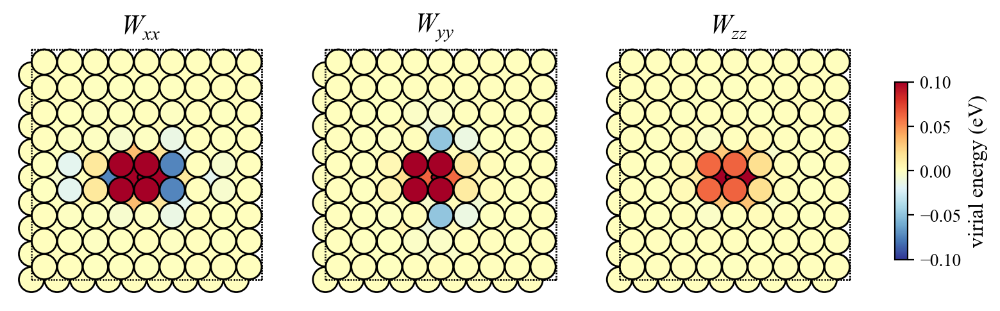

In [120]:
visiual_atoms_strain_3d(bulk_tetrahedral_1_md, is_eigen_force_field*6.241509e-6, input_range=[-0.1, 0.1], type='virial energy', units='eV')

$W _{xx}$
$W _{yy}$
$W _{zz}$


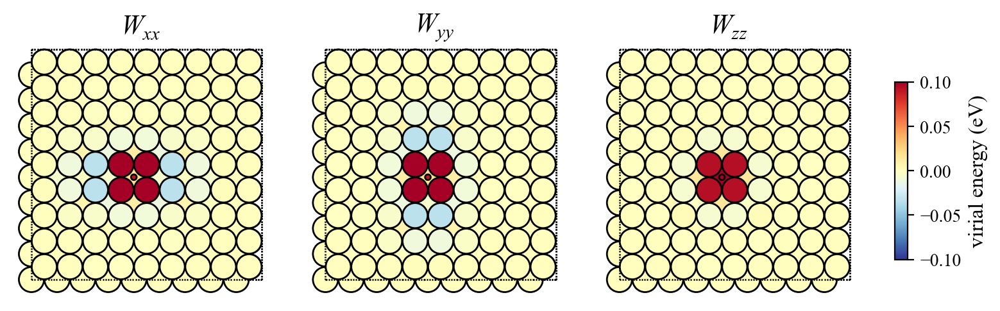

In [123]:
visiual_atoms_strain_3d(bulk_octahedral_md, ts_eigen_force_field*6.241509e-6, input_range=[-0.1, 0.1], type='virial energy', units='eV')

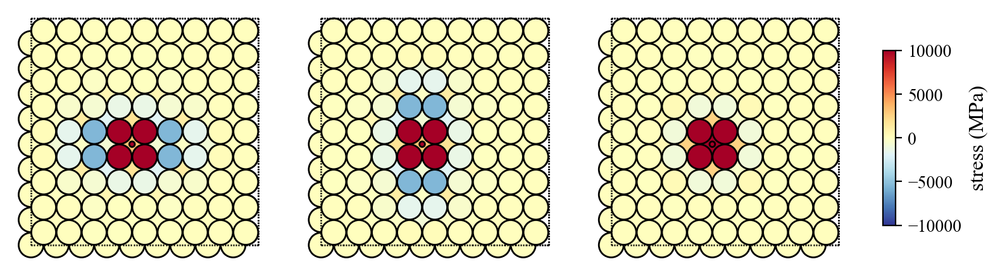

In [84]:
visiual_atoms_strain_3d(bulk_octahedral_md, ts_eigen_force_field, input_range=[-1E4, 1E4], type='stress', units='MPa')

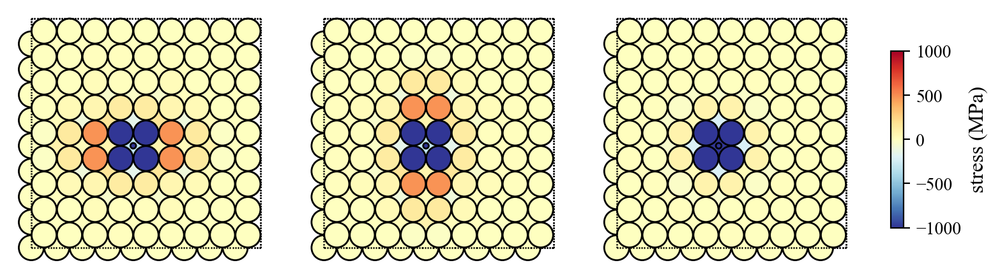

In [85]:
visiual_atoms_strain_3d(bulk_octahedral_md, ts_eigen_stress_field, input_range=[-1E3, 1E3], type='stress', units='MPa')

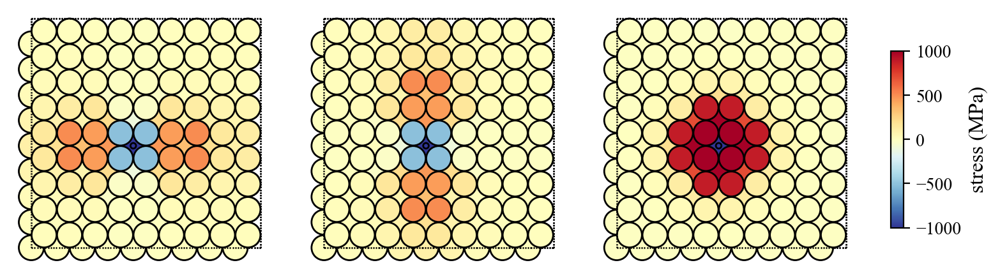

In [86]:
visiual_atoms_strain_3d(bulk_octahedral_md, ts_stress_field, input_range=[-1E3, 1E3], type='stress', units='MPa')

In [87]:
bulk_octahedral_md.get_positions()[-1]

array([11.34182546, 11.34182546, 24.10137909])

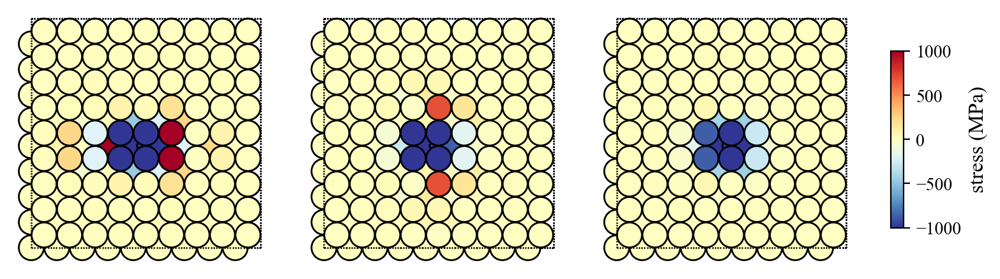

In [88]:
visiual_atoms_strain_3d(bulk_tetrahedral_1_md, is_eigen_stress_field, input_range=[-1E3, 1E3], type='stress', units='MPa')

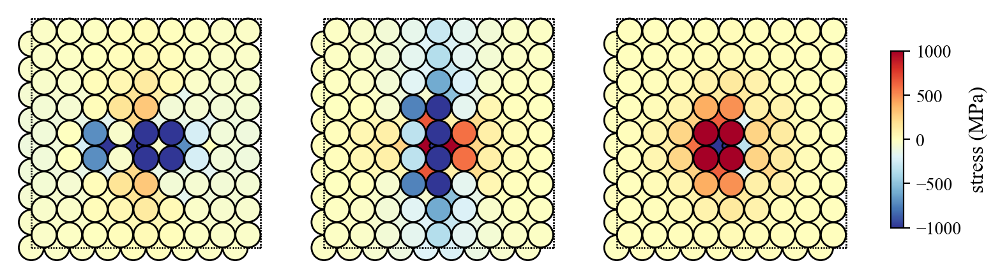

In [89]:
visiual_atoms_strain_3d(bulk_tetrahedral_1_md, is_stress_field, input_range=[-1E3, 1E3], type='stress', units='MPa')

/home/zwbai/soft/conda/envs/ase_model/lib/python3.9/site-packages/pymatgen/io/vasp/inputs.py:749: EncodingWarning: We strongly encourage explicit `encoding`, and we would use UTF-8 by default as per PEP 686
  with zopen(filename, "rt") as f:
/home/zwbai/soft/conda/envs/ase_model/lib/python3.9/site-packages/pymatgen/io/vasp/inputs.py:244: EncodingWarning: We strongly encourage explicit `encoding`, and we would use UTF-8 by default as per PEP 686
  with zopen(filename, "rt") as f:


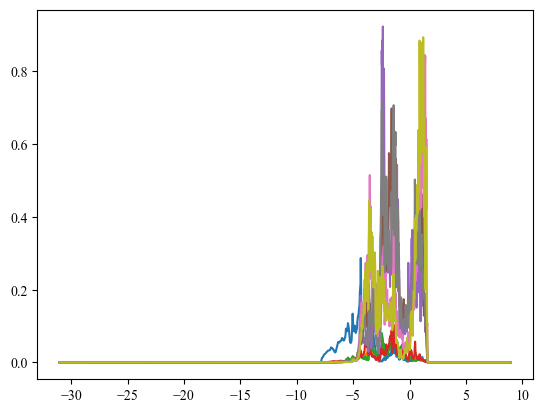

In [91]:
bulk_dos_path = join(savepath,'bulk_dos')
dos_data = read_one_car(bulk_dos_path,car='DOSCAR')
dos_e, dos_data = get_dos_atom_orbitals(bulk_dos_path, [1])  # dos_e 是能量轴，统一用了一个能量轴
d_c = cal_d(dos_e, np.sum(dos_data, axis=1))[1]
for i in range(dos_data.shape[1]):
    # 绘制线条，并获取颜色
    plt.plot(dos_e, dos_data[:, i],
                      linewidth=1.5)
plt.show()

In [92]:
strain_bulk_dos_path = join(savepath,'strain_bulk_dos')
_,strain_bulk_dos = read_car(strain_bulk_dos_path, car='DOSCAR')

1st dict_keys(['xy_n1', 'xy_n2', 'xy_p1', 'xy_p2', 'z_n1', 'z_n2', 'z_p1', 'z_p2'])


In [93]:
strain_bulk_dos_c = strain_bulk_dos.copy()
for key in strain_bulk_dos_c.keys():
    strain_bulk_dos_c[key] = cal_d(dos_e, strain_bulk_dos_c[key])[1]

In [94]:
strain_bulk_dos_c

{'xy_n1': -0.8163317363417619,
 'xy_n2': -1.1291791656801577,
 'xy_p1': -1.8461027524145541,
 'xy_p2': -1.6453843280388043,
 'z_n1': -0.8505135845460735,
 'z_n2': -1.121819848708582,
 'z_p1': -1.8258228755733021,
 'z_p2': -1.5915468094662768}

In [95]:
strain_bulk_dos_c['xy_p0'] = d_c
strain_bulk_dos_c['z_p0'] = d_c
xy_dos = []
z_dos = []
xy_strain = []
z_strain = []
for key in strain_bulk_dos_c.keys():
    s = key.split('_')[1]
    s = -float(s[1:]) if 'n' in s else float(s[1:])
    s = 1/s*0.04 if s != 0 else 0
    if 'xy' in key:
        xy_dos.append(strain_bulk_dos_c[key])
        xy_strain.append(s)

    elif 'z' in key:
        z_dos.append(strain_bulk_dos_c[key])
        z_strain.append(s)
combined = sorted(zip(z_strain, z_dos))
z_strain, z_dos = zip(*combined)  # 解压排序后的数据
combined = sorted(zip(xy_strain, xy_dos))
xy_strain, xy_dos = zip(*combined)  # 解压排序后的数据

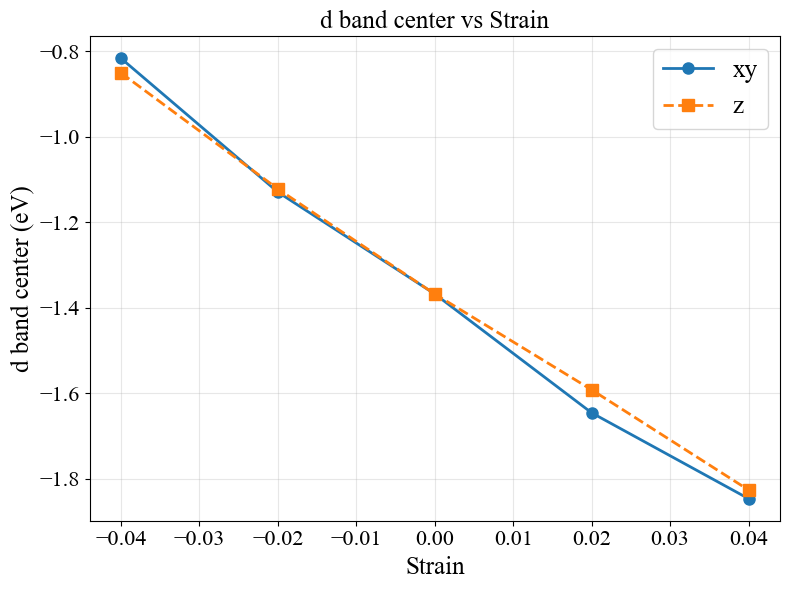

In [96]:
plt.figure(figsize=(8, 6))

plt.plot(xy_strain,
        xy_dos,
        marker='o',  # 偶数索引使用圆点，奇数索引使用方块
        linestyle='-',  # 偶数索引使用实线，奇数索引使用虚线
        linewidth = 2,
        markersize = 8,
        label=f'xy')  # 根据实际情况修改标签
plt.plot(z_strain,
        z_dos,
        marker='s',  # 偶数索引使用圆点，奇数索引使用方块
        linestyle= '--',  # 偶数索引使用实线，奇数索引使用虚线
        linewidth = 2,
        markersize = 8,
        label=f'z')  # 根据实际情况修改标签
plt.xlabel('Strain', fontsize=18)
plt.ylabel('d band center (eV)', fontsize=18)
plt.title('d band center vs Strain', fontsize=18)
plt.grid(True, alpha=0.3)
plt.legend(fontsize=18)
plt.tick_params(labelsize=16)
plt.tight_layout()
plt.show()

对d带的计算证明了，d带只与体应变相关